In [495]:
import numpy as np
import pandas as pd
import seaborn as sns

import anndata as ad
import spatialdata as sd
import spatialdata_plot
from spatialdata import SpatialData, polygon_query
from spatialdata_io import xenium

import scanpy as sc
import squidpy as sq
import cellcharter as cc
import scvi

import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib_venn import venn3
from matplotlib.colors import ListedColormap

from lightning.pytorch import seed_everything

import os

import mygene

import copy

from pathlib import Path

from collections import Counter

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.mixture import GaussianMixture
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, adjusted_rand_score, normalized_mutual_info_score, silhouette_score
from scipy.stats import gaussian_kde, pearsonr, ks_2samp, mannwhitneyu, chi2_contingency
from scipy.signal import find_peaks

In [6]:
varrone_df = pd.read_csv('/mnt/ptemp/virginia/project/Xenium_V1_FFPE_Human_Breast_IDC_cell_types.csv')

In [7]:
adata_big = sc.read_h5ad("/mnt/ptemp/virginia/project/breast_cancer_atlas_cellxgene_epithelial.h5ad")

In [8]:
adata_small = sc.read('/mnt/ptemp/virginia/project/adata_new.h5ad')

In [595]:
xenium = sd.read_zarr("/mnt/ptemp/virginia/project/Xenium_V1_FFPE_Human_Breast_IDC.zarr")

/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [12]:
# Clustering unimodale (con caratteristiche istologiche)
histological_features = pd.read_csv("/mnt/ptemp/virginia/project/Xenium_V1_FFPE_Human_Breast_IDC_phikon_icy-salad-378.csv")

In [13]:
# Clustering bimodale (con caratteristiche molecolari e istologiche)
bimodal_features = pd.read_csv("/mnt/ptemp/virginia/project/Xenium_V1_FFPE_Human_Breast_IDC_multi_proud_rain_419.csv")

In [14]:
# Clustering unimodale (con caratteristiche molecolari)
molecular_features = pd.read_csv("/mnt/ptemp/virginia/project/Xenium_V1_FFPE_Human_Breast_IDC_molecular_mild-dawn-408.csv")

In [15]:
molecular_single_features = pd.read_csv("/mnt/ptemp/virginia/project/Xenium_V1_FFPE_Human_Breast_IDC_molecular_epithelial.csv")

In [16]:
histological_single_features = pd.read_csv("/mnt/ptemp/virginia/project/Xenium_V1_FFPE_Human_Breast_IDC_histology_epithelial.csv")

In [17]:
# Carico il file 'epithelial_cells' che contiene solo le cellule epiteliali con la classificazione di Marco
epithelial_cells = sc.read_h5ad("epithelial_cells_cell_type_prediction.h5ad")

In [18]:
sc.pp.normalize_total(epithelial_cells, inplace=True)
sc.pp.log1p(epithelial_cells) 

/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:235: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


In [19]:
# CARICO LE FEATURES NEI RISPETTIVI ANNDATA
def add_features_to_adata(adata, feature_df, obsm_key, epithelial_cells=None, add_cell_type=True, table_key="table"):
    
    # Trovo le cellule comuni
    common_cells = adata.obs["cell_id"].isin(feature_df['cell_id'].index)
    adata_filtered = adata[common_cells].copy()

    # Aggiungo 'cell_type_prediction' se richiesto
    if add_cell_type and epithelial_cells is not None:
        common_obs = epithelial_cells.obs_names.intersection(adata_filtered.obs_names)
        epithelial_filtered = epithelial_cells[common_obs]
        adata_filtered.obs['cell_type_prediction'] = epithelial_filtered.obs['cell_type_prediction'].reindex(adata_filtered.obs_names)

    # Allineo le feature
    feature_matched = feature_df.loc[adata_filtered.obs["cell_id"]]
    assert all(feature_matched.index == adata_filtered.obs["cell_id"]), "Mismatch in cell order!"

    if "cell_id" in feature_matched.columns:
        feature_matched = feature_matched.drop(columns="cell_id")

    # Aggiungo le feature in obsm e converte in float32
    adata_filtered.obsm[obsm_key] = feature_matched.astype('float32').to_numpy()
    adata_filtered.uns[obsm_key + "_feature_names"] = feature_matched.columns.tolist()

    # Converto anche X in float32
    adata_filtered.X = adata_filtered.X.astype('float32')

    # Salvo in xenium.tables se necessario
    xenium.tables[table_key] = adata_filtered

    print(f"Features added to `obsm['{obsm_key}']`. {adata_filtered.n_obs} total cells.")

    return adata_filtered

In [21]:
adata_histological_features = add_features_to_adata(
    adata=epithelial_cells,
    feature_df=histological_features,
    obsm_key="histological_features",
    epithelial_cells=epithelial_cells)

adata_bimodal_features = add_features_to_adata(
    adata=epithelial_cells,
    feature_df=bimodal_features,
    obsm_key="bimodal_features",
    epithelial_cells=epithelial_cells)

adata_molecular_features = add_features_to_adata(
    adata=epithelial_cells,
    feature_df=molecular_features,
    obsm_key="molecular_features",
    epithelial_cells=epithelial_cells)

/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/spatialdata/_core/_elements.py:125: UserWarning: Key `table` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


Features added to `obsm['histological_features']`. 350718 total cells.


/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/spatialdata/_core/_elements.py:125: UserWarning: Key `table` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


Features added to `obsm['bimodal_features']`. 350718 total cells.
Features added to `obsm['molecular_features']`. 350718 total cells.


/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/spatialdata/_core/_elements.py:125: UserWarning: Key `table` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


In [22]:
def add_features_to_adata(adata, feature_df, obsm_key, epithelial_cells=None, add_cell_type=True, table_key="table"):
    
    # Match su colonna 'cell_id'
    common_cells = adata.obs["cell_id"].isin(feature_df['cell_id'])
    adata_filtered = adata[common_cells].copy()

    # Filtra feature_df per cellule presenti in adata_filtered
    feature_filtered = feature_df[feature_df['cell_id'].isin(adata_filtered.obs['cell_id'])].copy()

    # Riordina feature_filtered in base all'ordine di adata_filtered.obs['cell_id']
    feature_filtered = feature_filtered.set_index('cell_id')
    feature_filtered = feature_filtered.loc[adata_filtered.obs['cell_id']].reset_index()

    # Aggiungo 'cell_type_prediction' se richiesto
    if add_cell_type and epithelial_cells is not None:
        common_obs = epithelial_cells.obs_names.intersection(adata_filtered.obs_names)
        epithelial_filtered = epithelial_cells[common_obs]
        adata_filtered.obs['cell_type_prediction'] = epithelial_filtered.obs['cell_type_prediction'].reindex(adata_filtered.obs_names)

    # Ora tolgo 'cell_id' per inserire solo feature numeriche
    features_only = feature_filtered.drop(columns='cell_id')

    # Aggiungo le feature in obsm e converto in float32
    adata_filtered.obsm[obsm_key] = features_only.astype('float32').to_numpy()
    adata_filtered.uns[obsm_key + "_feature_names"] = features_only.columns.tolist()

    # Converto anche X in float32
    adata_filtered.X = adata_filtered.X.astype('float32')

    # Salvo in xenium.tables se necessario
    xenium.tables[table_key] = adata_filtered

    print(f"Features added to `obsm['{obsm_key}']`. {adata_filtered.n_obs} total cells.")

    return adata_filtered

In [23]:
adata_molecular_single_features = add_features_to_adata(
    adata=epithelial_cells,
    feature_df=molecular_single_features,
    obsm_key="molecular_single_features",
    epithelial_cells=epithelial_cells)

adata_histological_single_features = add_features_to_adata(
    adata=epithelial_cells,
    feature_df=histological_single_features,
    obsm_key="histological_single_features",
    epithelial_cells=epithelial_cells)

/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/spatialdata/_core/_elements.py:125: UserWarning: Key `table` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


Features added to `obsm['molecular_single_features']`. 350729 total cells.
Features added to `obsm['histological_single_features']`. 350569 total cells.


/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/spatialdata/_core/_elements.py:125: UserWarning: Key `table` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


Iteration 1/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 2/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 3/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 4/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 5/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 6/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 7/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 8/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 9/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 10/10


  0%|          | 0/16 [00:00<?, ?it/s]

/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/torchgmm/base/estimator/configurable.py:23: UserWarning: Failed to serialize fitted attributes of `GaussianMixture` to JSON. Falling back to `pickle`.
  super().save_attributes(path)


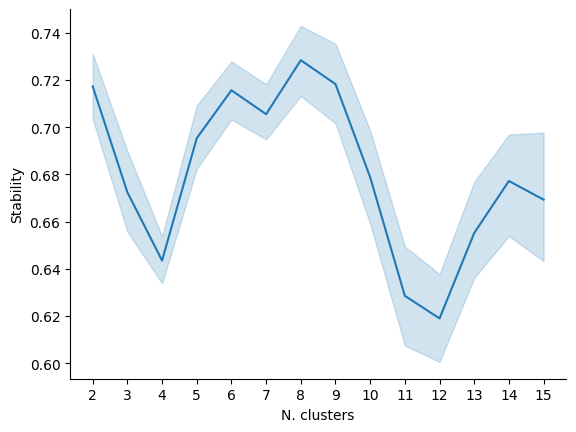

In [687]:
# HISTOLOGICAL_FEATURES 15 clusters 

autok_histological_features = cc.tl.ClusterAutoK(
    n_clusters=(2,15), 
    max_runs=10,
    convergence_tol=0.001)

autok_histological_features.fit(adata_histological_features, use_rep='histological_features')

ax = cc.pl.autok_stability(autok_histological_features, return_ax=True)
fig = ax.get_figure()
fig.savefig("autok_phikon_plot.pdf", dpi=300)

save_path = Path("saved_models/autok_phikon")
save_path.mkdir(parents=True, exist_ok=True)
autok_histological_features.save(save_path, best_k=False)  # Cambia in best_k=True se vuoi salvare solo il migliore

Iteration 1/10


  0%|          | 0/31 [00:00<?, ?it/s]

Iteration 2/10


  0%|          | 0/31 [00:00<?, ?it/s]

Iteration 3/10


  0%|          | 0/31 [00:00<?, ?it/s]

Iteration 4/10


  0%|          | 0/31 [00:00<?, ?it/s]

Iteration 5/10


  0%|          | 0/31 [00:00<?, ?it/s]

Iteration 6/10


  0%|          | 0/31 [00:00<?, ?it/s]

Iteration 7/10


  0%|          | 0/31 [00:00<?, ?it/s]

Iteration 8/10


  0%|          | 0/31 [00:00<?, ?it/s]

Iteration 9/10


  0%|          | 0/31 [00:00<?, ?it/s]

Iteration 10/10


  0%|          | 0/31 [00:00<?, ?it/s]

/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/torchgmm/base/estimator/configurable.py:23: UserWarning: Failed to serialize fitted attributes of `GaussianMixture` to JSON. Falling back to `pickle`.
  super().save_attributes(path)


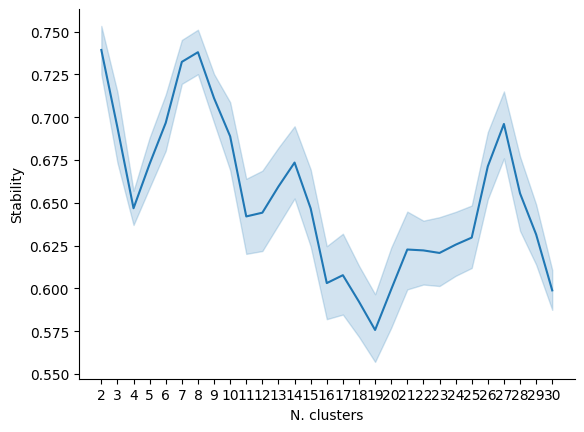

In [1169]:
# HISTOLOGICAL_FEATURES 30 clusters

autok_histological_features_30 = cc.tl.ClusterAutoK(
    n_clusters=(2,30), 
    max_runs=10,
    convergence_tol=0.001)

autok_histological_features_30.fit(adata_histological_features, use_rep='histological_features')

ax_30 = cc.pl.autok_stability(autok_histological_features_30, return_ax=True)
fig = ax_30.get_figure()
fig.savefig("autok_phikon_30_plot.pdf", dpi=300)

save_path = Path("saved_models/autok_phikon_30")
save_path.mkdir(parents=True, exist_ok=True)
autok_histological_features_30.save(save_path, best_k=False)  # Cambia in best_k=True se vuoi salvare solo il migliore

Iteration 1/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 2/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 3/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 4/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 5/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 6/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 7/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 8/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 9/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 10/10


  0%|          | 0/16 [00:00<?, ?it/s]

/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/torchgmm/base/estimator/configurable.py:23: UserWarning: Failed to serialize fitted attributes of `GaussianMixture` to JSON. Falling back to `pickle`.
  super().save_attributes(path)


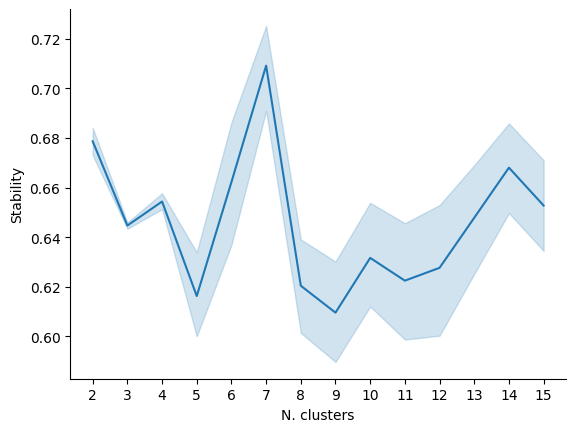

In [688]:
# ADATA_BIMODAL_FEATURES 15 clusters

autok_multi = cc.tl.ClusterAutoK(
    n_clusters=(2, 15), 
    max_runs=10,
    convergence_tol=0.001)

autok_multi.fit(adata_bimodal_features, use_rep='bimodal_features')

ax_multi = cc.pl.autok_stability(autok_multi, return_ax=True)
fig_multi = ax_multi.get_figure()
fig_multi.savefig("autok_multi_plot.pdf", dpi=300)

save_path = Path("saved_models/autok_multi")
save_path.mkdir(parents=True, exist_ok=True)
autok_multi.save(save_path, best_k=False)

Iteration 1/10


  0%|          | 0/31 [00:00<?, ?it/s]

Iteration 2/10


  0%|          | 0/31 [00:00<?, ?it/s]

Iteration 3/10


  0%|          | 0/31 [00:00<?, ?it/s]

Iteration 4/10


  0%|          | 0/31 [00:00<?, ?it/s]

Iteration 5/10


  0%|          | 0/31 [00:00<?, ?it/s]

Iteration 6/10


  0%|          | 0/31 [00:00<?, ?it/s]

Iteration 7/10


  0%|          | 0/31 [00:00<?, ?it/s]

Iteration 8/10


  0%|          | 0/31 [00:00<?, ?it/s]

Iteration 9/10


  0%|          | 0/31 [00:00<?, ?it/s]

Iteration 10/10


  0%|          | 0/31 [00:00<?, ?it/s]

/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/torchgmm/base/estimator/configurable.py:23: UserWarning: Failed to serialize fitted attributes of `GaussianMixture` to JSON. Falling back to `pickle`.
  super().save_attributes(path)


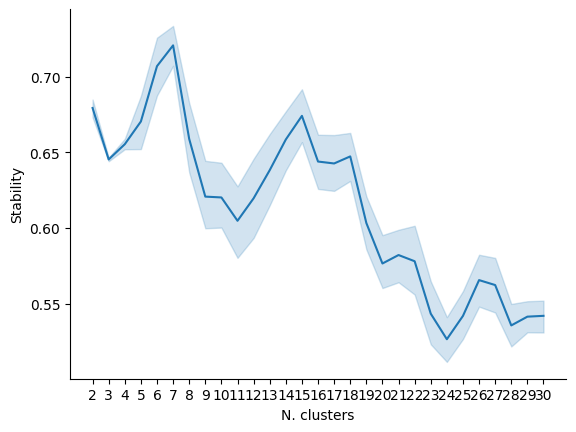

In [1171]:
# ADATA_BIMODAL_FEATURES 30 clusters

autok_multi_30 = cc.tl.ClusterAutoK(
    n_clusters=(2, 30), 
    max_runs=10,
    convergence_tol=0.001)

autok_multi_30.fit(adata_bimodal_features, use_rep='bimodal_features')

ax_multi_30 = cc.pl.autok_stability(autok_multi_30, return_ax=True)
fig_multi = ax_multi_30.get_figure()
fig_multi.savefig("autok_multi_30_plot.pdf", dpi=300)

save_path = Path("saved_models/autok_multi_30")
save_path.mkdir(parents=True, exist_ok=True)
autok_multi_30.save(save_path, best_k=False)

Iteration 1/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 2/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 3/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 4/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 5/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 6/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 7/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 8/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 9/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 10/10


  0%|          | 0/16 [00:00<?, ?it/s]

/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/torchgmm/base/estimator/configurable.py:23: UserWarning: Failed to serialize fitted attributes of `GaussianMixture` to JSON. Falling back to `pickle`.
  super().save_attributes(path)


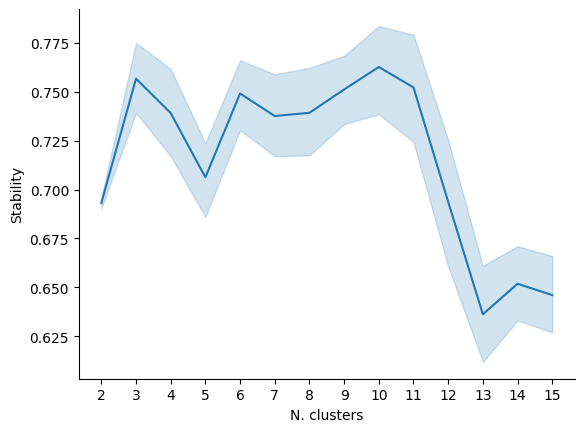

In [693]:
# ADATA_MOLECULAR_FEATURES 15 clusters

autok_molecular = cc.tl.ClusterAutoK(
    n_clusters=(2, 15), 
    max_runs=10,
    convergence_tol=0.001)

autok_molecular.fit(adata_molecular_features, use_rep='molecular_features')

ax_molecular = cc.pl.autok_stability(autok_molecular, return_ax=True)
fig_molecular = ax_molecular.get_figure()
fig_molecular.savefig("autok_molecular_plot.pdf", dpi=300)

save_path = Path("saved_models/autok_molecular")
save_path.mkdir(parents=True, exist_ok=True)
autok_molecular.save(save_path, best_k=False)

In [ ]:
# ADATA_MOLECULAR_FEATURES 15 clusters e 30 iterazioni

# sia per la versione scaled che per la versione unscaled!!!!

autok_molecular_30_iter = cc.tl.ClusterAutoK(
    n_clusters=(2, 15), 
    max_runs=30,
    convergence_tol=0.00001)

autok_molecular_30_iter.fit(adata_molecular_features, use_rep='molecular_features')

ax_molecular_30_iter = cc.pl.autok_stability(autok_molecular_30_iter, return_ax=True)
fig_molecular = ax_molecular_30_iter.get_figure()
fig_molecular.savefig("autok_molecular_30_iter_plot.pdf", dpi=300)

save_path = Path("saved_models/autok_molecular_30_iter")
save_path.mkdir(parents=True, exist_ok=True)
autok_molecular_30_iter.save(save_path, best_k=False)

Iteration 1/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 2/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 3/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 4/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 5/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 6/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 7/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 8/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 9/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 10/10


  0%|          | 0/16 [00:00<?, ?it/s]

/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/torchgmm/base/estimator/configurable.py:23: UserWarning: Failed to serialize fitted attributes of `GaussianMixture` to JSON. Falling back to `pickle`.
  super().save_attributes(path)


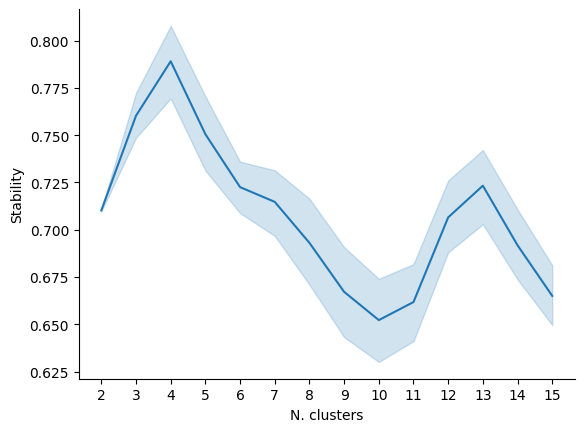

In [799]:
# ADATA_HISTOLOGICAL_SINGLE_FEATURES_DOWNSAMPLING - clustering 15 clusters

autok_histological_ds = cc.tl.ClusterAutoK(
    n_clusters=(2, 15),
    max_runs=10,
    convergence_tol=0.001)

autok_histological_ds.fit(histological_single_features_downsampling, use_rep='histological_single_features')

# Plot stability
ax_histological_ds = cc.pl.autok_stability(autok_histological_ds, return_ax=True)
fig_histological_ds = ax_histological_ds.get_figure()
fig_histological_ds.savefig("autok_histological_downsampling_plot.pdf", dpi=300)

# Save model in a new directory
save_path_ds = Path("saved_models/autok_histological_downsampling")
save_path_ds.mkdir(parents=True, exist_ok=True)
autok_histological_ds.save(save_path_ds, best_k=False)

In [803]:
histological_single_features_downsampling

AnnData object with n_obs × n_vars = 54722 × 280
    obs: 'cell_id', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'region', 'sample', 'level1', 'level2', 'malignant_signature', 'normal_signature', 'cell_type_prediction', 'GMM_single_clusters', 'batch', 'gmm_single_clusters_downsampling'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'neighbors', 'umap', 'gmm_single_clusters_downsampling_colors', 'cell_type_prediction_colors'
    obsm: 'spatial', 'histological_single_features', 'X_umap'
    obsp: 'distances', 'connectivities'

In [24]:
# Per caricare i modelli autok salvati
autok_histological_loaded = cc.tl.ClusterAutoK.load("saved_models/autok_phikon")
autok_bimodal_loaded = cc.tl.ClusterAutoK.load("saved_models/autok_multi")
autok_molecular_loaded = cc.tl.ClusterAutoK.load("saved_models/autok_molecular")
autok_histological_single_ds_loaded = cc.tl.ClusterAutoK.load("saved_models/autok_histological_downsampling")

In [805]:
histological_single_features_downsampling.obs['cluster_4_unscaled'] = autok_histological_single_ds_loaded.predict(histological_single_features_downsampling, use_rep='histological_single_features', k=4)


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


In [26]:
# FACCIO AUTOK.PREDICT NEI RISPETTIVI ANNDATA CON LE RISPETTIVE FEATURES
adata_histological_features.obs['cluster_8_unscaled'] = autok_histological_loaded.predict(adata_histological_features, use_rep='histological_features', k=8)

adata_molecular_features.obs['cluster_4_unscaled'] = autok_molecular_loaded.predict(adata_molecular_features, use_rep='molecular_features', k=4)
adata_molecular_features.obs['cluster_10_unscaled'] = autok_molecular_loaded.predict(adata_molecular_features, use_rep='molecular_features', k=10)

adata_bimodal_features.obs['cluster_7_unscaled'] = autok_bimodal_loaded.predict(adata_bimodal_features, use_rep='bimodal_features', k=7)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


In [ ]:
## PARAMETRI

In [45]:
# ADATA_HISTOLOGICAL_FEATURE
n_comp = 8
adata = adata_histological_features

## DEFINIZIONE DEI CLUSTER
malignant_clusters = [0, 2, 3, 4, 7]
normal_clusters = [1, 5]
unknown_clusters = [6]

In [809]:
# ADATA_HISTOLOGICAL_SINGLE_FEATURES_DS
n_comp = 4
adata = histological_single_features_downsampling

## DEFINIZIONE DEI CLUSTER
malignant_clusters = [1, 3]
normal_clusters = [0, 2]
#unknown_clusters = []

In [51]:
# ADATA_BIMODAL_FEATURES
n_comp = 7
adata = adata_bimodal_features

## DEFINIZIONE DEI CLUSTER
malignant_clusters = [0, 2, 3, 6]
normal_clusters = [1, 5]
unknown_clusters = [4]

In [47]:
# ADATA_MOLECULAR_FEATURES
n_comp = 10
adata = adata_molecular_features

## DEFINIZIONE DEI CLUSTER: i cluster non sono stati definiti poichè 
#il confronto successivo è stato fatto con cell_type_prediction trovato con i dati molecolari

In [807]:
# Conto le occorrenze di ciascun tipo cellulare nel dataset
cell_type_counts = adata.obs['cell_type_prediction'].value_counts()

# Calcolo il numero totale di cellule
total_cells = cell_type_counts.sum()

# Calcolo le percentuali dinamicamente
malignant_pct_total = (cell_type_counts.get('Malignant', 0) / total_cells) * 100
normal_pct_total = (cell_type_counts.get('Normal', 0) / total_cells) * 100
unknown_pct_total = (cell_type_counts.get('Unknown', 0) / total_cells) * 100

/tmp/ipykernel_1097759/1813390432.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_counts = adata.obs.groupby([cluster_col, "cell_type_prediction"]).size().unstack(fill_value=0)


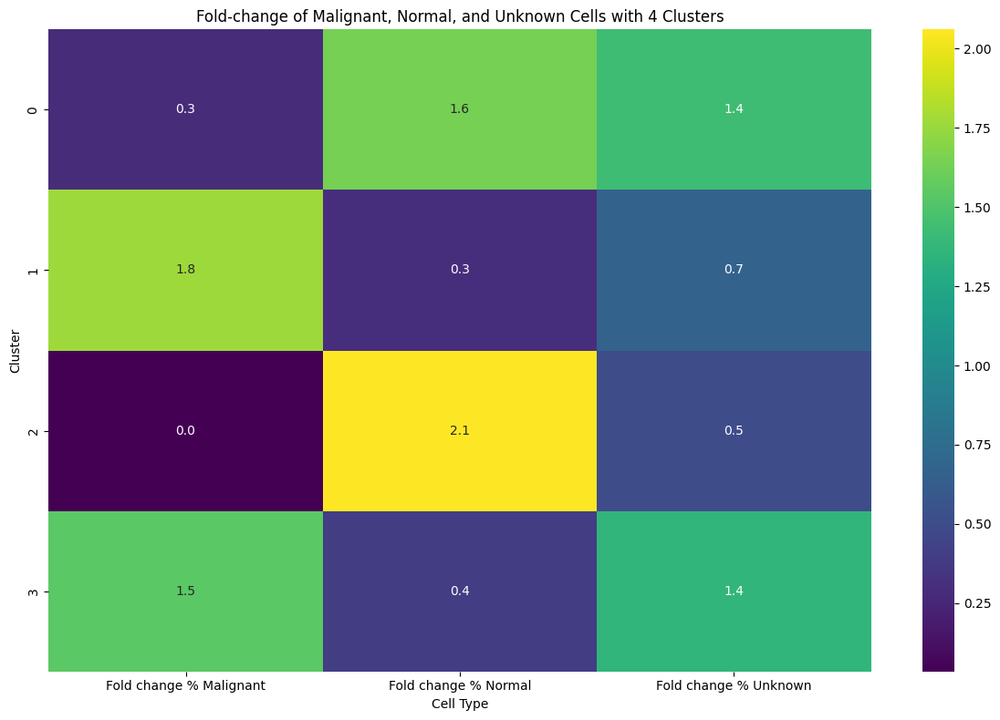

In [808]:
cluster_col = f'cluster_{n_comp}_unscaled'

# Tabella a doppia entrata tra cluster e predizione del tipo cellulare
crosstab = pd.crosstab(adata.obs[cluster_col], adata.obs['cell_type_prediction'])

# Tabella con conteggio totale e percentuali
cluster_counts = adata.obs.groupby([cluster_col, "cell_type_prediction"]).size().unstack(fill_value=0)
cluster_counts["Total"] = cluster_counts.sum(axis=1)
cluster_counts["Malignant %"] = cluster_counts["Malignant"] / cluster_counts["Total"] * 100
cluster_counts["Normal %"] = cluster_counts["Normal"] / cluster_counts["Total"] * 100
cluster_counts["Unknown %"] = cluster_counts["Unknown"] / cluster_counts["Total"] * 100

# Calcolo del fold-change rispetto alle percentuali complessive nell'intero dataset
cluster_counts["Fold change % Malignant"] = cluster_counts["Malignant %"] / malignant_pct_total
cluster_counts["Fold change % Normal"] = cluster_counts["Normal %"] / normal_pct_total
cluster_counts["Fold change % Unknown"] = cluster_counts["Unknown %"] / unknown_pct_total

# HEATMAP
filename = f"figures/HEATMAP_{cluster_col}.pdf"

plt.figure(figsize=(12, 8))
sns.heatmap(
    cluster_counts[["Fold change % Malignant", "Fold change % Normal", "Fold change % Unknown"]],
    cmap="viridis", annot=True, fmt=".1f")

plt.title(f"Fold-change of Malignant, Normal, and Unknown Cells with {n_comp} Clusters")
plt.xlabel("Cell Type")
plt.ylabel("Cluster")
plt.tight_layout()
plt.savefig(filename)
plt.show()
plt.close()

# Crea un DataFrame con i cell_id (che sono gli index di adata.obs) e i cluster
df_clusters = pd.DataFrame({
    'cell_id': adata.obs_names,             # Index di AnnData corrisponde ai cell ID
    cluster_col: adata.obs[cluster_col].values})

# Salva in CSV
output_path = f"results/cluster_value_{cluster_col}.csv"
df_clusters.to_csv(output_path, index=False)

reclassified_cluster_4_unscaled
Normal (original)       25000
Malignant (original)    25000
Unknown → Malignant      2489
Unknown → Normal         2233
Name: count, dtype: int64
['Normal', 'Malignant', 'Unknown']
Categories (3, object): ['Malignant', 'Normal', 'Unknown']


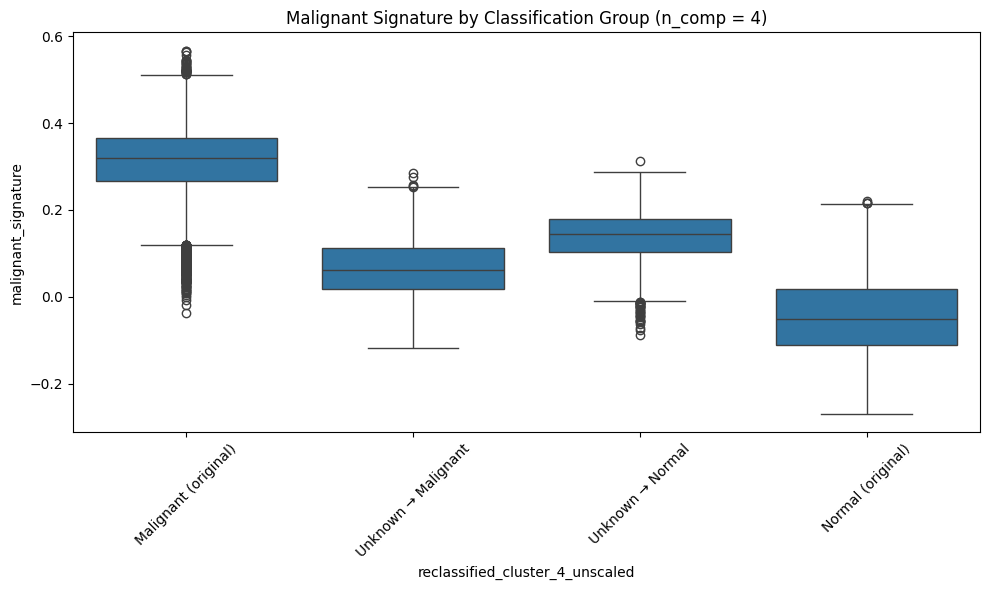

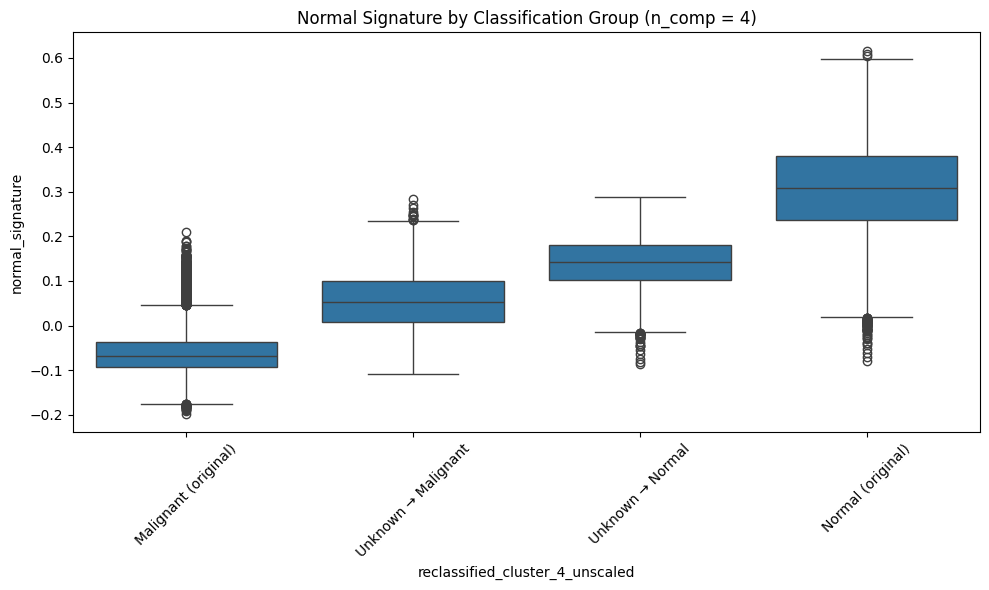

In [812]:
# USO LE SIGNATURE MALIGNANT E NORMAL CHE HO TROVATO CON I DATI MOLECOLARI 
new_cluster_col = f"new_cluster_{n_comp}_unscaled"   # Classificazione in Normal, Malignant e Unknown basata sul cluster

# Funzione per assegnare etichetta in base al cluster
def assign_cluster_label(cluster):
    if cluster in malignant_clusters:
        return "Malignant"
    elif cluster in normal_clusters:
        return "Normal"
    elif cluster in unknown_clusters:
        return "Unknown"
    else:
        return "Undefined"

# Applicazione funzione
adata.obs[new_cluster_col] = adata.obs[cluster_col].apply(assign_cluster_label)

# Riclassificazione combinata originale vs cluster
def classify_group(row):
    original = row['cell_type_prediction']
    new = row[new_cluster_col]
    if original == 'Malignant':
        return 'Malignant (original)'
    elif original == 'Normal':
        return 'Normal (original)'
    elif original == 'Unknown':
        if new == 'Malignant':
            return 'Unknown → Malignant'
        elif new == 'Normal':
            return 'Unknown → Normal'
        else:
            return 'Unknown (unchanged)'
    else:
        return 'Other'

reclassified_col = f'reclassified_cluster_{n_comp}_unscaled'
adata.obs[reclassified_col] = adata.obs.apply(classify_group, axis=1)

print(adata.obs[reclassified_col].value_counts())
print(adata.obs['cell_type_prediction'].unique())

# 5. Ordino i gruppi per plotting (invariato)
order_malignant = [
    'Malignant (original)',
    'Unknown → Malignant',
    'Unknown (unchanged)',
    'Unknown → Normal',
    'Normal (original)']
order_normal = order_malignant

# 6. Boxplot - Malignant Signature (usa direttamente la signature)
plt.figure(figsize=(10, 6))
sns.boxplot(
    data=adata.obs,
    x=reclassified_col,
    y='malignant_signature',  # Ora punta alla colonna della signature
    order=order_malignant)
plt.title(f'Malignant Signature by Classification Group (n_comp = {n_comp})')
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig(f'figures/AUTOK_Malignant_signature_clusters_{n_comp}.pdf', dpi=300)  # Fix: aggiunto f-string
plt.show()
plt.close()

# 7. Boxplot - Normal Signature (usa direttamente la signature)
plt.figure(figsize=(10, 6))
sns.boxplot(
    data=adata.obs,
    x=reclassified_col,
    y='normal_signature',  # Ora punta alla colonna della signature
    order=order_normal)
plt.title(f'Normal Signature by Classification Group (n_comp = {n_comp})')
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig(f'figures/AUTOK_Normal_signature_clusters_{n_comp}.pdf', dpi=300)  # Fix: aggiunto f-string
plt.show()
plt.close()

# Esporto i risultati
df_export = pd.DataFrame({
    'cell_id': adata.obs['cell_id'].values,
    reclassified_col: adata.obs[reclassified_col].values})
df_export.to_csv(f'results/AUTOK_reclassified_cluster_{n_comp}.csv', index=False)

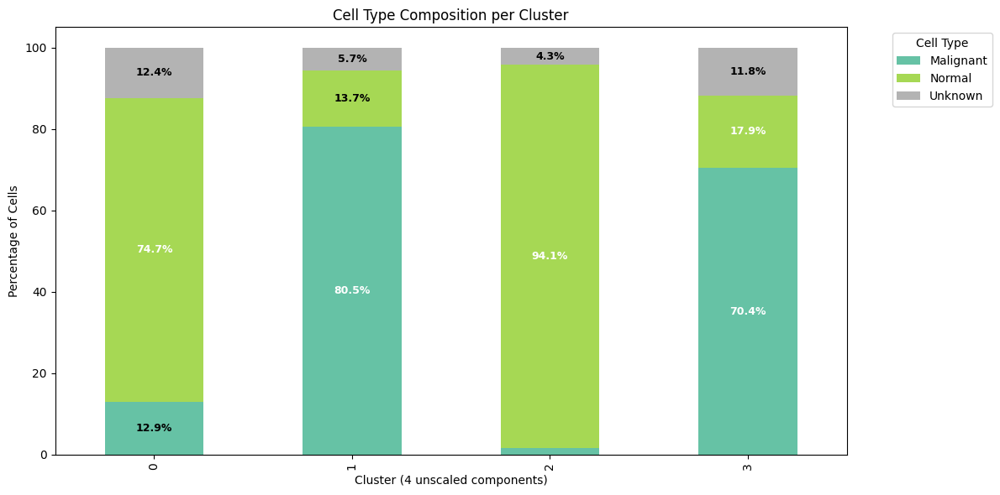

In [813]:
# Ricalcolo se necessario
cluster_col = f'cluster_{n_comp}_unscaled'
df = adata.obs.copy()

cluster_dist = pd.crosstab(df[cluster_col], df['cell_type_prediction'])
cluster_pct = cluster_dist.div(cluster_dist.sum(axis=1), axis=0) * 100

# Plot
ax = cluster_pct.plot(
    kind='bar',
    stacked=True,
    figsize=(12, 6),
    colormap='Set2')

# Aggiunte le percentuali sopra le sezioni
for i, cluster in enumerate(cluster_pct.index):
    y_offset = 0
    for cell_type in cluster_pct.columns:
        pct = cluster_pct.loc[cluster, cell_type]
        if pct > 3:  # Visualizza solo se > 3% per evitare sovrapposizioni
            ax.text(
                i,                        # posizione x
                y_offset + pct / 2,       # posizione y (metà del segmento)
                f'{pct:.1f}%',            # testo
                ha='center',
                va='center',
                fontsize=9,
                color='white' if pct > 15 else 'black',
                fontweight='bold')
        y_offset += pct

plt.ylabel('Percentage of Cells')
plt.xlabel(f'Cluster ({n_comp} unscaled components)')
plt.title('Cell Type Composition per Cluster')
plt.legend(title='Cell Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig(f'figures/StackedBar_celltype_composition_cluster_{n_comp}_labeled.pdf', dpi=300)
plt.show()
plt.close()

In [814]:
reclassified_col = f'reclassified_cluster_{n_comp}_unscaled'

# Filtra i gruppi specifici
df_sub = adata.obs[adata.obs['cell_type_prediction'] == 'Unknown']

# Conta le categorie
group_counts = df_sub[reclassified_col].value_counts()
print(group_counts)

reclassified_cluster_4_unscaled
Unknown → Malignant    2489
Unknown → Normal       2233
Name: count, dtype: int64


/tmp/ipykernel_1097759/888837981.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(
/tmp/ipykernel_1097759/888837981.py:37: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = df.groupby(x_var)['total_counts'].mean()
posx and posy should be finite values
posx and posy should be finite values


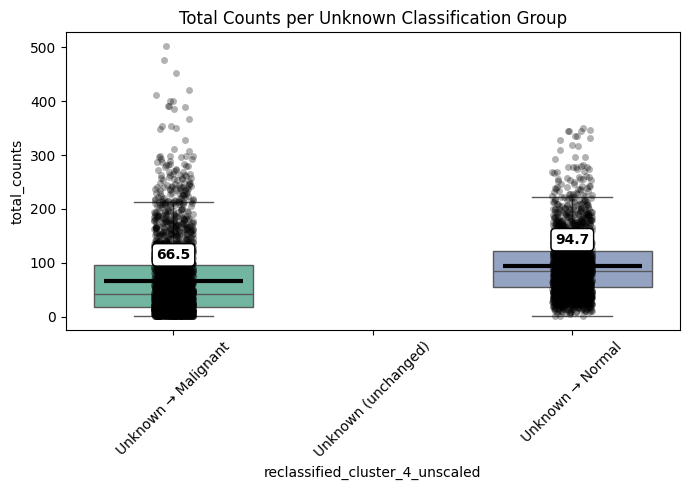

In [815]:
# Colonna con la riclassificazione
reclassified_col = f'reclassified_cluster_{n_comp}_unscaled'

# Filtra solo le cellule che erano Unknown
df_unknown = adata.obs[adata.obs['cell_type_prediction'] == 'Unknown'].copy()

# Tiene solo le 3 categorie di interesse
plot_order = ['Unknown → Malignant', 'Unknown (unchanged)', 'Unknown → Normal']
df_plot = df_unknown[df_unknown[reclassified_col].isin(plot_order)].copy()

# Imposta l'ordine desiderato per la colonna categorica
import pandas as pd
df_plot[reclassified_col] = pd.Categorical(
    df_plot[reclassified_col],
    categories=plot_order,
    ordered=True)

# Funzione per boxplot + stripplot
def plot_counts(df, x_var, title, palette='Set2', figsize=(7, 5)):
    plt.figure(figsize=figsize)
    ax = sns.boxplot(
        data=df,
        x=x_var,
        y='total_counts',
        palette=palette,
        showfliers=False)
    
    sns.stripplot(
        data=df,
        x=x_var,
        y='total_counts',
        color='black',
        alpha=0.3,
        jitter=True,
        ax=ax)
    
    means = df.groupby(x_var)['total_counts'].mean()
    categories = df[x_var].cat.categories if hasattr(df[x_var], "cat") else df[x_var].unique()
    y_range = df['total_counts'].max() - df['total_counts'].min()
    
    for i, cat in enumerate(categories):
        mean_val = means[cat]
        # Linea orizzontale spessa e nera
        ax.hlines(mean_val, i - 0.35, i + 0.35, colors='black', linewidth=3)
        
        # Rettangolo bianco con bordo nero per testo
        bbox_props = dict(boxstyle="round,pad=0.3", fc="white", ec="black", lw=1)
        
        ax.text(i, mean_val + 0.07 * y_range, f"{mean_val:.1f}",
                ha='center', va='bottom', fontsize=10, fontweight='bold', color='black',
                bbox=bbox_props)
    
    plt.title(title)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Applico la funzione
plot_counts(
    df_plot,
    x_var=reclassified_col,
    title='Total Counts per Unknown Classification Group',
    palette='Set2')

In [ ]:
# Analisi: 
# Confrontare U→M e U→N con la stessa distribuzione di total_counts 
# Verificare se le signature cambiano 


# La differenza negli score della Malignant_signature tra i gruppi 
# U→M e U→N è influenzata dalle diverse distribuzioni di total_counts?

# 1. Filtro le cellule appartenenti a U→M e U→N
# 2. Divido i dati in 200 bin quantili basati su total_counts per tutto il dataset insieme 
# (in modo che i bin siano gli stessi per entrambi i gruppi)
# 3. Per ogni bin, estraggo un campione uguale di cellule
# 4. Plot KDE (Kernel Density Estimate) per visualizzare la distribuzione di total_counts dei due gruppi campionati
# 5. Confronto gli score delle firme maligne e normali tra i due gruppi

/tmp/ipykernel_1097759/1168942230.py:56: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.

  sns.stripplot(data=df_long, x='signature', y='score', hue='group', dodge=True, color='black', alpha=0.3, jitter=True, legend=False)


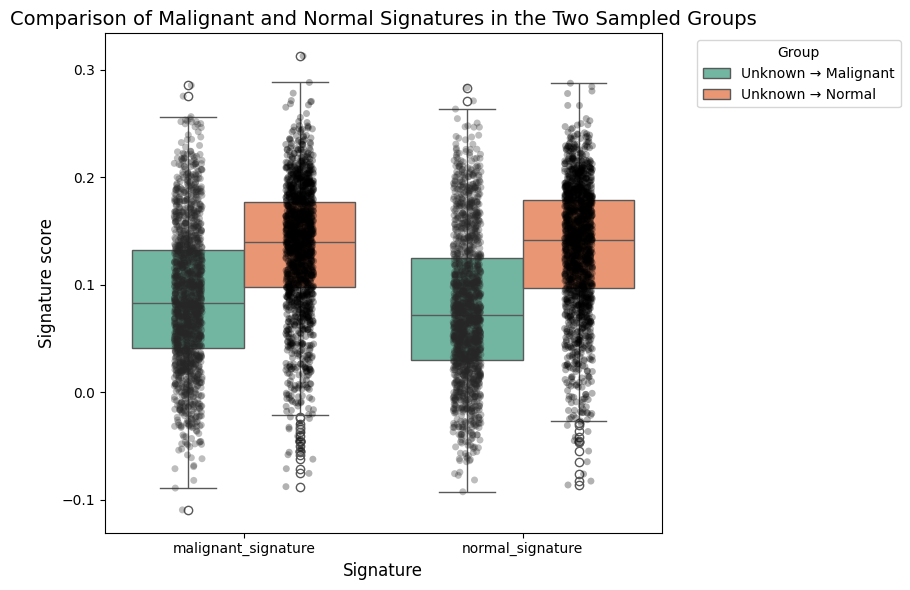


Final proportional distribution by bin - Unknown → Malignant:
count_bin
(0.998, 2.0]        0.001995
(2.0, 3.0]          0.000000
(3.0, 4.0]          0.000000
(4.0, 5.0]          0.000665
(5.0, 6.0]          0.000000
                      ...   
(239.975, 251.0]    0.005984
(251.0, 264.185]    0.005984
(264.185, 282.0]    0.007979
(282.0, 329.79]     0.004654
(329.79, 503.0]     0.005319
Name: proportion, Length: 165, dtype: float64

Final proportional distribution by bin - Unknown → Normal:
count_bin
(0.998, 2.0]        0.001995
(2.0, 3.0]          0.000000
(3.0, 4.0]          0.000000
(4.0, 5.0]          0.000665
(5.0, 6.0]          0.000000
                      ...   
(239.975, 251.0]    0.005984
(251.0, 264.185]    0.005984
(264.185, 282.0]    0.007979
(282.0, 329.79]     0.004654
(329.79, 503.0]     0.005319
Name: proportion, Length: 165, dtype: float64


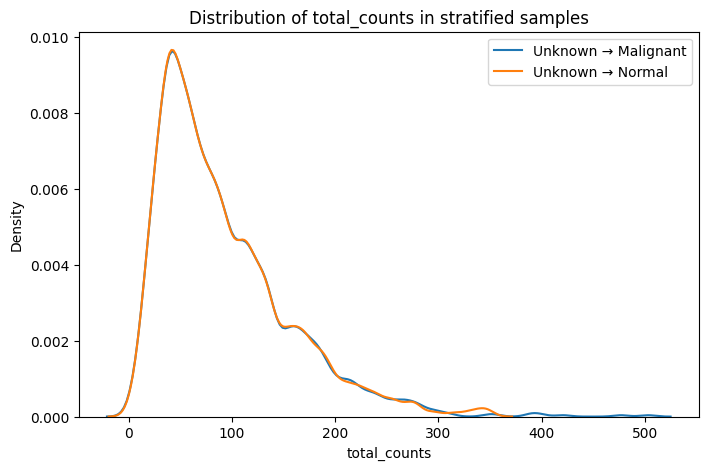

In [816]:
# Filtro le cellule dei due gruppi in un unico dataframe
df_unknown = adata.obs[adata.obs[reclassified_col].isin(['Unknown → Malignant', 'Unknown → Normal'])].copy()

# Definisco i bin comuni calcolandoli sull'intero dataframe insieme
n_bins = 200
df_unknown['count_bin'] = pd.qcut(df_unknown['total_counts'], q=n_bins, duplicates='drop')

# Suddivido i gruppi
df_malignant_group = df_unknown[df_unknown[reclassified_col] == 'Unknown → Malignant'].copy()
df_normal_group = df_unknown[df_unknown[reclassified_col] == 'Unknown → Normal'].copy()

def stratified_sample_same_bins_with_print(df_group1, df_group2, n_samples_per_bin=25):
    # Individua bin comuni in cui entrambi hanno almeno 1 cellula
    bins_group1 = set(df_group1['count_bin'].value_counts().index)
    bins_group2 = set(df_group2['count_bin'].value_counts().index)
    common_bins = sorted(list(bins_group1.intersection(bins_group2)))

    samples1 = []
    samples2 = []

    for b in common_bins:
        bin_df1 = df_group1[df_group1['count_bin'] == b]
        bin_df2 = df_group2[df_group2['count_bin'] == b]

        min_count = min(len(bin_df1), len(bin_df2), n_samples_per_bin)
        if min_count == 0:           
            continue
        
        samples1.append(bin_df1.sample(n=min_count, random_state=42))
        samples2.append(bin_df2.sample(n=min_count, random_state=42))

    sampled_df1 = pd.concat(samples1).drop(columns='count_bin')
    sampled_df2 = pd.concat(samples2).drop(columns='count_bin')

    return sampled_df1, sampled_df2, common_bins

# Campiono
sampled_malignant, sampled_normal, common_bins = stratified_sample_same_bins_with_print(df_malignant_group, df_normal_group, n_samples_per_bin=25)

# Estraggo gli indici campionati
cells_malignant = sampled_malignant.index.tolist()
cells_normal = sampled_normal.index.tolist()

# Preparo dataframe per confronto firme
df_malignant = adata.obs.loc[cells_malignant, ['malignant_signature', 'normal_signature']].copy()
df_malignant['group'] = 'Unknown → Malignant'

df_normal = adata.obs.loc[cells_normal, ['malignant_signature', 'normal_signature']].copy()
df_normal['group'] = 'Unknown → Normal'

df_compare = pd.concat([df_malignant, df_normal])
df_long = df_compare.melt(id_vars='group', var_name='signature', value_name='score')

plt.figure(figsize=(9, 6))
sns.boxplot(data=df_long, x='signature', y='score', hue='group', palette='Set2')
sns.stripplot(data=df_long, x='signature', y='score', hue='group', dodge=True, color='black', alpha=0.3, jitter=True, legend=False)

plt.title("Comparison of Malignant and Normal Signatures in the Two Sampled Groups", fontsize=14)
plt.ylabel("Signature score", fontsize=12)
plt.xlabel("Signature", fontsize=12)
plt.legend(title='Group', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Aggiungo i total_counts ai campioni
sampled_malignant = sampled_malignant.assign(total_counts=adata.obs.loc[sampled_malignant.index, 'total_counts'])
sampled_normal = sampled_normal.assign(total_counts=adata.obs.loc[sampled_normal.index, 'total_counts'])

# Ricreo i bin sui campioni usando gli intervalli originali
# Ottiengo gli estremi degli intervalli dai bin comuni (sono pd.Interval)
bin_edges = [common_bins[0].left] + [interval.right for interval in common_bins]

sampled_malignant['count_bin'] = pd.cut(sampled_malignant['total_counts'], bins=bin_edges, include_lowest=True)
sampled_normal['count_bin'] = pd.cut(sampled_normal['total_counts'], bins=bin_edges, include_lowest=True)

# Stampo distribuzione proporzionale per bin
print("\nFinal proportional distribution by bin - Unknown → Malignant:")
print(sampled_malignant['count_bin'].value_counts(normalize=True).sort_index())

print("\nFinal proportional distribution by bin - Unknown → Normal:")
print(sampled_normal['count_bin'].value_counts(normalize=True).sort_index())

# Plot KDE delle distribuzioni di total_counts
plt.figure(figsize=(8,5))
sns.kdeplot(sampled_malignant['total_counts'], label='Unknown → Malignant', bw_adjust=0.5)
sns.kdeplot(sampled_normal['total_counts'], label='Unknown → Normal', bw_adjust=0.5)
plt.title('Distribution of total_counts in stratified samples')
plt.xlabel('total_counts')
plt.ylabel('Density')
plt.legend()
plt.show()


 Running DGE: Unknown → Malignant vs Malignant (n = 27489)
 CSV salvato in: results/DGE/DGE_Unknown_to_Malignant_vs_Malignant.csv


<Figure size 800x600 with 0 Axes>

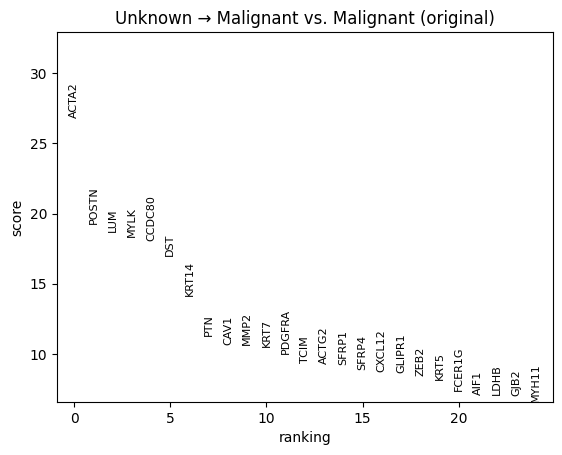


 Running DGE: Unknown (unchanged) vs Malignant (n = 25000)


AttributeError: 'NoneType' object has no attribute 'columns'

<Figure size 640x480 with 0 Axes>

In [818]:
# Parametri
reclassified_col = 'reclassified_cluster_4_unscaled'
celltype_col = 'cell_type_prediction'

# Output dirs
os.makedirs('results/DGE', exist_ok=True)

# Gruppi da confrontare
unknown_subgroups = ['Unknown → Malignant', 'Unknown (unchanged)', 'Unknown → Normal']
references = ['Malignant', 'Normal']

# Loop su tutte le combinazioni
for ref in references:
    for unk_group in unknown_subgroups:
        contrast_name = f"{unk_group.replace(' ', '_').replace('→', 'to')}_vs_{ref}"

        # Filtro le cellule coinvolte
        cells_condition = (
            (adata.obs[reclassified_col] == unk_group) |
            (adata.obs[celltype_col] == ref))
        sub_adata = adata[cells_condition].copy()

        # Colonna temporanea con i gruppi
        sub_adata.obs['dge_group'] = sub_adata.obs[reclassified_col].where(
            sub_adata.obs[reclassified_col] == unk_group,
            f"{ref} (original)")

        print(f"\n Running DGE: {unk_group} vs {ref} (n = {sub_adata.n_obs})")

        # DGE analysis
        sc.tl.rank_genes_groups(sub_adata, groupby='dge_group', reference=f"{ref} (original)", method='wilcoxon')

        # Estraggo e salva i risultati
        res = sub_adata.uns['rank_genes_groups']
        group = [g for g in res['names'].dtype.names if g != f"{ref} (original)"][0]

        dge_df = pd.DataFrame({
            'gene': res['names'][group],
            'logfoldchange': res['logfoldchanges'][group],
            'pval': res['pvals'][group],
            'pval_adj': res['pvals_adj'][group]})

        # Salvo risultati
        dge_csv_path = f"results/DGE/DGE_{contrast_name}.csv"
        dge_df.to_csv(dge_csv_path, index=False)
        print(f" CSV salvato in: {dge_csv_path}")

        # Plot (top 25)
        plt.figure(figsize=(8, 6))
        sc.pl.rank_genes_groups(
            sub_adata,
            n_genes=25,
            sharey=False,
            show=True,  
            use_raw=False,
            title=f"{unk_group} vs {ref}")
        plt.tight_layout()


 Generating dotplot: Unknown → Malignant vs Malignant


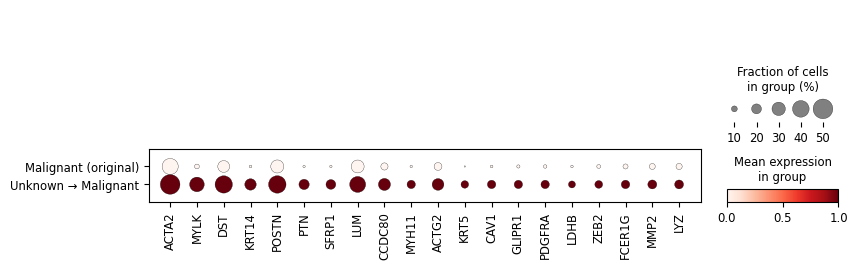


 Generating dotplot: Unknown (unchanged) vs Malignant


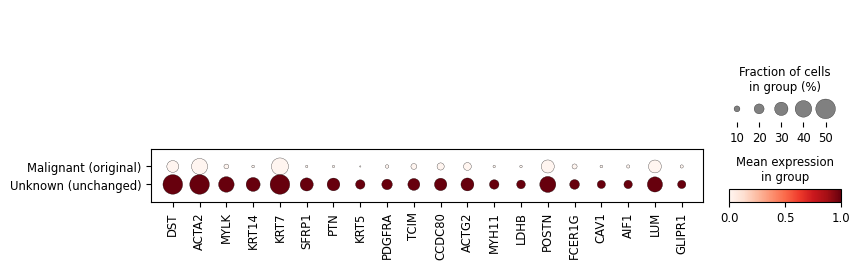


 Generating dotplot: Unknown → Normal vs Malignant


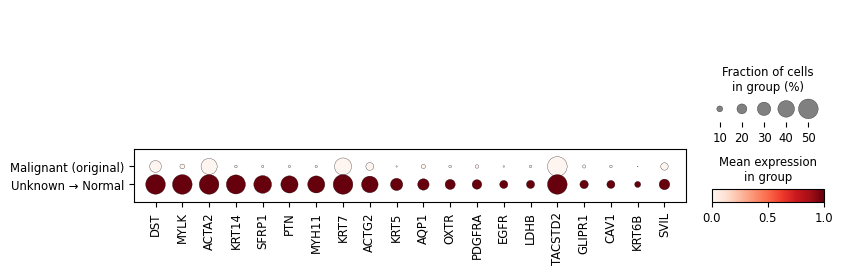


 Generating dotplot: Unknown → Malignant vs Normal


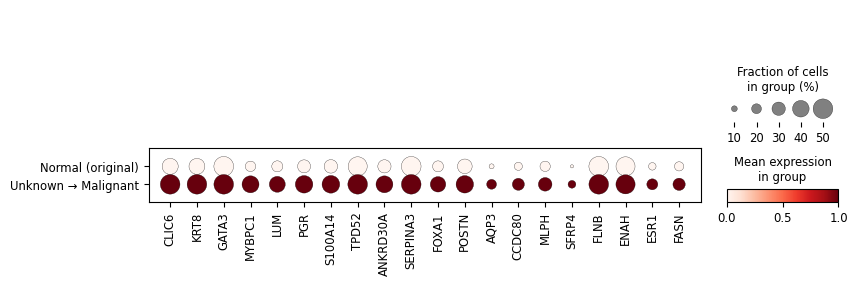


 Generating dotplot: Unknown (unchanged) vs Normal


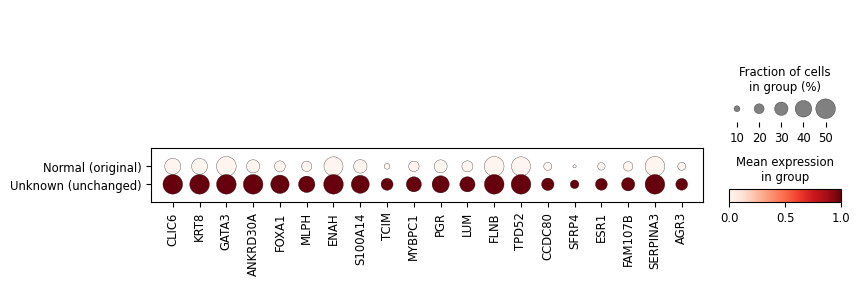


 Generating dotplot: Unknown → Normal vs Normal


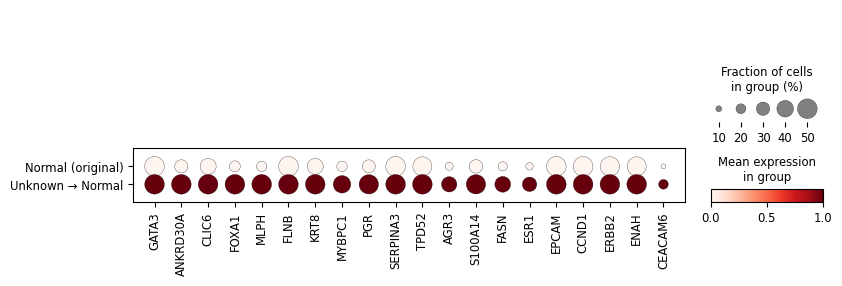

In [40]:
# Colonne
reclassified_col = 'reclassified_cluster_8_unscaled'
celltype_col = 'cell_type_prediction'

# Output dir
os.makedirs('figures/DGE_dotplot', exist_ok=True)

# Gruppi
unknown_subgroups = ['Unknown → Malignant', 'Unknown (unchanged)', 'Unknown → Normal']
references = ['Malignant', 'Normal']

# Loop
for ref in references:
    for unk_group in unknown_subgroups:
        contrast_name = f"{unk_group.replace(' ', '_').replace('→', 'to')}_vs_{ref}"

        # Filtra le celle
        cells_condition = (
            (adata.obs[reclassified_col] == unk_group) |
            (adata.obs[celltype_col] == ref)
        )
        sub_adata = adata[cells_condition].copy()

        # Crea colonna di gruppi
        sub_adata.obs['dge_group'] = sub_adata.obs[reclassified_col].where(
            sub_adata.obs[reclassified_col] == unk_group,
            f"{ref} (original)"
        )

        print(f"\n Generating dotplot: {unk_group} vs {ref}")

        # Esegui DGE
        sc.tl.rank_genes_groups(sub_adata, groupby='dge_group', reference=f"{ref} (original)", method='wilcoxon')

        # Prendi top 20 geni significativi
        result = sub_adata.uns['rank_genes_groups']
        group = [g for g in result['names'].dtype.names if g != f"{ref} (original)"][0]
        top_genes = pd.Series(result['names'][group]).dropna().head(20).tolist()

        # Dotplot
        sc.pl.dotplot(
            sub_adata,
            var_names=top_genes,
            groupby='dge_group',
            standard_scale='var',
            dot_max=0.5,
            color_map='Reds',
            show=True,
            save=f"_dotplot_{contrast_name}.pdf")

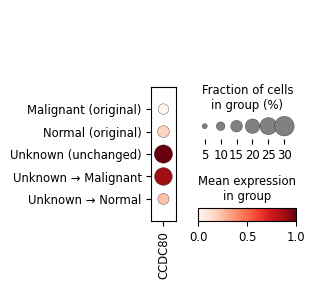

In [41]:
sc.pl.dotplot(
    adata,
    var_names=['CCDC80'],
    groupby='reclassified_cluster_8_unscaled',  
    standard_scale='var',
    color_map='Reds',
    show=True)

In [43]:
# Estraggo espressione del gene e la inserisci come colonna in obs
adata.obs['CCDC80_expr'] = adata[:, 'CCDC80'].X.toarray().flatten()

# Raggruppo per gruppo di classificazione e calcola la media
adata.obs.groupby('reclassified_cluster_8_unscaled')['CCDC80_expr'].mean().sort_values(ascending=False)

/tmp/ipykernel_1097759/1702358580.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs.groupby('reclassified_cluster_8_unscaled')['CCDC80_expr'].mean().sort_values(ascending=False)


reclassified_cluster_8_unscaled
Unknown (unchanged)     0.395370
Unknown → Malignant     0.362996
Unknown → Normal        0.174787
Normal (original)       0.156809
Malignant (original)    0.109792
Name: CCDC80_expr, dtype: float32

In [57]:
# Per avere una classificazione finale delle cellule 

# Creo la nuova colonna con la classificazione semplificata
adata.obs['final_labels'] = adata.obs[reclassified_col].apply(
    lambda x: 'Malignant' if x in ['Malignant (original)', 'Unknown → Malignant'] 
             else 'Normal' if x in ['Normal (original)', 'Unknown → Normal'] 
             else 'Unknown' if x == 'Unknown (unchanged)' 
             else x)

print(adata.obs['final_labels'].value_counts())

final_labels
Malignant    322191
Normal        27753
Unknown         774
Name: count, dtype: int64


bimodal_pred    Malignant  Normal  Unknown
histology_pred                            
Malignant            1414     140       53
Normal                103    2117      215
Unknown               300      33      506


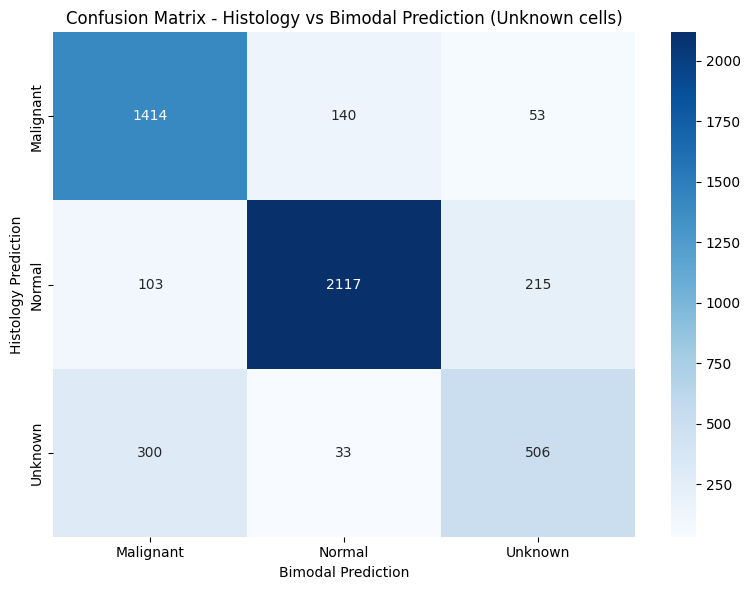

In [58]:
# Istologia
adata_histo = adata_histological_features.copy()

# Bimodale
adata_bimodal = adata_bimodal_features.copy()

# Creo DataFrame con classificazione di unknown dalle due fonti
df_confusion = pd.DataFrame({
    'cell_id': adata_histo.obs_names,
    'histology_pred': adata_histo.obs['final_labels'],
    'bimodal_pred': adata_bimodal.obs['final_labels'],})

# Tengo solo le cellule che erano 'Unknown' in entrambe (opzionale)
df_confusion_filtered = df_confusion[
    (adata_histo.obs['cell_type_prediction'] == 'Unknown') &
    (adata_bimodal.obs['cell_type_prediction'] == 'Unknown')]

# Confusion matrix
conf_mat = pd.crosstab(df_confusion_filtered['histology_pred'], df_confusion_filtered['bimodal_pred'])
print(conf_mat)

plt.figure(figsize=(8,6))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - Histology vs Bimodal Prediction (Unknown cells)')
plt.xlabel('Bimodal Prediction')
plt.ylabel('Histology Prediction')
plt.tight_layout()
plt.show()

In [59]:
def standardize_features(adata, obsm_key, new_obsm_key):
    scaler = StandardScaler()
    X = adata.obsm[obsm_key]
    X_scaled = scaler.fit_transform(X)
    adata.obsm[new_obsm_key] = X_scaled
    return adata

In [60]:
adata_histological_features = standardize_features(
    adata_histological_features,
    obsm_key="histological_features",
    new_obsm_key="histological_features_scaled")

adata_molecular_features = standardize_features(
    adata_molecular_features,
    obsm_key="molecular_features",
    new_obsm_key="molecular_features_scaled")

adata_bimodal_features = standardize_features(
    adata_bimodal_features,
    obsm_key="bimodal_features",
    new_obsm_key="bimodal_features_scaled")

In [820]:
histological_single_features_downsampling = standardize_features(
    histological_single_features_downsampling,
    obsm_key="histological_single_features",
    new_obsm_key="histological_single_features_scaled")

Iteration 1/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 2/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 3/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 4/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 5/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 6/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 7/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 8/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 9/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 10/10


  0%|          | 0/16 [00:00<?, ?it/s]

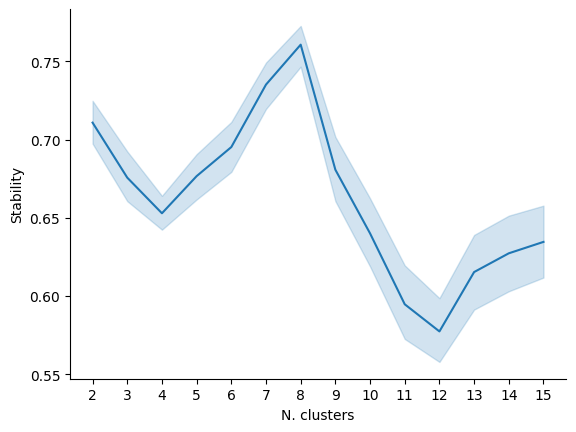

In [461]:
# ADATA_HISTOLOGICAL_FEATURE SCALED

autok_scaled = cc.tl.ClusterAutoK(
    n_clusters=(2,15), 
    max_runs=10,
    convergence_tol=0.001)

adata_histological_features.obsm['histological_features_scaled'] = adata_histological_features.obsm['histological_features_scaled'].astype('float32')

autok_scaled.fit(adata_histological_features, use_rep='histological_features_scaled')

ax_scaled = cc.pl.autok_stability(autok_scaled, return_ax=True)
fig_scaled = ax_scaled.get_figure()
fig_scaled.savefig("autok_stability_scaled_plot.pdf", dpi=300)

save_path = Path("saved_models/autok_phikon_scaled")
save_path.mkdir(parents=True, exist_ok=True)
autok_scaled.save(save_path, best_k=False)

In [62]:
#ADATA_HISTOLOGICAL_FEATURE --> ISTOLOGIA SCALED
autok_histological_features_scaled_loaded = cc.tl.ClusterAutoK.load("saved_models/autok_phikon_scaled")

adata_histological_features.obs['cluster_8_scaled'] = autok_histological_features_scaled_loaded.predict(adata_histological_features, use_rep='histological_features_scaled', k=8)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


In [ ]:
# ADATA_HISTOLOGICAL_SINGLE_FEATURE SCALED

autok_single_scaled = cc.tl.ClusterAutoK(
    n_clusters=(2,15), 
    max_runs=10,
    convergence_tol=0.001)

histological_single_features_downsampling.obsm['histological_single_features_scaled'] = histological_single_features_downsampling.obsm['histological_single_features_scaled'].astype('float32')

autok_single_scaled.fit(histological_single_features_downsampling, use_rep='histological_single_features_scaled')

ax_single_scaled = cc.pl.autok_stability(autok_single_scaled, return_ax=True)
fig_scaled = ax_single_scaled.get_figure()
fig_scaled.savefig("autok_single_stability_scaled_plot.pdf", dpi=300)

save_path = Path("saved_models/autok_single_features_scaled")
save_path.mkdir(parents=True, exist_ok=True)
autok_single_scaled.save(save_path, best_k=False)

Iteration 1/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 2/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 3/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 4/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 1/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 2/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 3/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 4/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 5/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 6/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 7/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 8/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 9/10


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 10/10


  0%|          | 0/16 [00:00<?, ?it/s]

/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/torchgmm/base/estimator/configurable.py:23: UserWarning: Failed to serialize fitted attributes of `GaussianMixture` to JSON. Falling back to `pickle`.
  super().save_attributes(path)


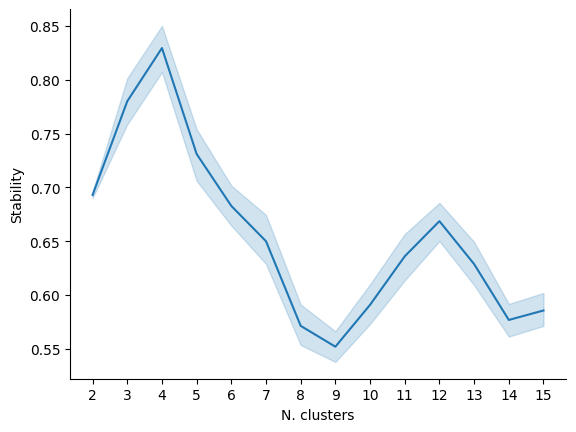

In [784]:
# ADATA_MOLECULAR_FEATURES SCALED con 15 clusters e 10 iterazioni

autok_molecular_scaled = cc.tl.ClusterAutoK(
    n_clusters=(2,15), 
    max_runs=10,
    convergence_tol=0.001)

adata_molecular_features.obsm['molecular_features_scaled'] = adata_molecular_features.obsm['molecular_features_scaled'].astype('float32')

autok_molecular_scaled.fit(adata_molecular_features, use_rep='molecular_features_scaled')

ax_molecular_scaled = cc.pl.autok_stability(autok_molecular_scaled, return_ax=True)
fig_molecular_scaled = ax_molecular_scaled.get_figure()
fig_molecular_scaled.savefig("autok_stability_molecular_scaled_plot.pdf", dpi=300)

save_path = Path("saved_models/autok_molecular_scaled")
save_path.mkdir(parents=True, exist_ok=True)
autok_molecular_scaled.save(save_path, best_k=False)

Iteration 1/30


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 2/30


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 3/30


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 4/30


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 5/30


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 6/30


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 7/30


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 8/30


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 9/30


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 10/30


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 11/30


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 12/30


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 13/30


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 14/30


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 15/30


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 16/30


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 17/30


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 18/30


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 19/30


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 20/30


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 21/30


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 22/30


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 23/30


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 24/30


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 25/30


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 26/30


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 27/30


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 28/30


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 29/30


  0%|          | 0/16 [00:00<?, ?it/s]

Iteration 30/30


  0%|          | 0/16 [00:00<?, ?it/s]

/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/torchgmm/base/estimator/configurable.py:23: UserWarning: Failed to serialize fitted attributes of `GaussianMixture` to JSON. Falling back to `pickle`.
  super().save_attributes(path)


AttributeError: 'ClusterAutoK' object has no attribute 'labels_'

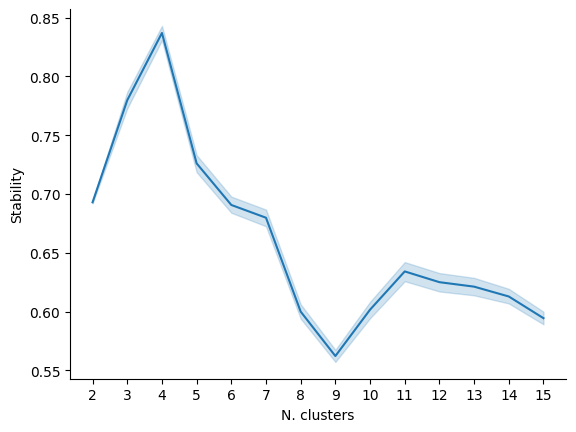

In [197]:
# ADATA_MOLECULAR_FEATURES SCALED con 15 clusters e 30 iterazioni

autok_molecular_scaled_30_iter = cc.tl.ClusterAutoK(
    n_clusters=(2,15), 
    max_runs=30,
    convergence_tol=0.00001)

# Crea una copia della rappresentazione e salvala con un nome diverso
adata_molecular_features.obsm['molecular_features_scaled_30_iter'] = adata_molecular_features.obsm['molecular_features_scaled'].astype('float32')

# Fit del modello sul nuovo embedding
autok_molecular_scaled_30_iter.fit(adata_molecular_features, use_rep='molecular_features_scaled_30_iter')

# Plot della stabilità del clustering
ax_molecular_scaled_30_iter = cc.pl.autok_stability(autok_molecular_scaled_30_iter, return_ax=True)
fig_molecular_scaled_30_iter = ax_molecular_scaled_30_iter.get_figure()
fig_molecular_scaled_30_iter.savefig("autok_stability_molecular_scaled_30_iter_plot.pdf", dpi=300)

# Salvataggio del modello
save_path_30_iter = Path("saved_models/autok_molecular_scaled_30_iter")
save_path_30_iter.mkdir(parents=True, exist_ok=True)
autok_molecular_scaled_30_iter.save(save_path_30_iter, best_k=False)

In [66]:
######## ADATA MOLECULAR --> MOLECOLARE SCALED
autok_molecular_scaled_loaded = cc.tl.ClusterAutoK.load("saved_models/autok_molecular_scaled")

adata_molecular_features.obs['cluster_4_scaled'] = autok_molecular_scaled_loaded.predict(adata_molecular_features, use_rep='molecular_features_scaled', k=4)
adata_molecular_features.obs['cluster_10_scaled'] = autok_molecular_scaled_loaded.predict(adata_molecular_features, use_rep='molecular_features_scaled', k=10)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


In [ ]:
# ADATA_BIMODAL_FEATURES SCALED

autok_multi_scaled = cc.tl.ClusterAutoK(
    n_clusters=(2,15), 
    max_runs=10,
    convergence_tol=0.001)

adata_bimodal_features.obsm['bimodal_features_scaled'] = adata_bimodal_features.obsm['bimodal_features_scaled'].astype('float32')

autok_bimodal_scaled.fit(adata_bimodal_features, use_rep='bimodal_features_scaled')

ax_bimodal_scaled = cc.pl.autok_stability(autok_bimodal_scaled, return_ax=True)
fig_bimodal_scaled = ax_bimodal_scaled.get_figure()
fig_bimodal_scaled.savefig("autok_stability_multi_scaled_plot.pdf", dpi=300)

save_path = Path("saved_models/autok_multi_scaled")
save_path.mkdir(parents=True, exist_ok=True)
autok_bimodal_scaled.save(save_path, best_k=False)

In [ ]:
# ADATA_BIMODAL_FEATURES--> SCALED
autok_bimodal_scaled_loaded = cc.tl.ClusterAutoK.load("saved_models/autok_molecular_scaled")
#adata_bimodal_features.obs['multi_cluster_scaled'] = autok_bimodal_scaled_loaded.predict(adata_bimodal_features, use_rep='bimodal_features_scaled', k=)

In [65]:
def preprocess_and_umap(adata, rep_name):
    sc.pp.normalize_total(adata)
    sc.pp.log1p(adata)
    sc.pp.neighbors(adata, use_rep=rep_name)
    sc.tl.umap(adata)

# Utilizzo con i miei dataset
preprocess_and_umap(adata_histological_features, 'histological_features')
preprocess_and_umap(adata_molecular_features, 'molecular_features')
preprocess_and_umap(adata_bimodal_features, 'bimodal_features')

preprocess_and_umap(adata_histological_single_features, 'histological_single_features')
preprocess_and_umap(adata_molecular_single_features, 'molecular_single_features')

/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:235: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:235: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:235: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:235: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


In [ ]:
preprocess_and_umap(histological_single_features_downsampling,, 'histological_single_feature')

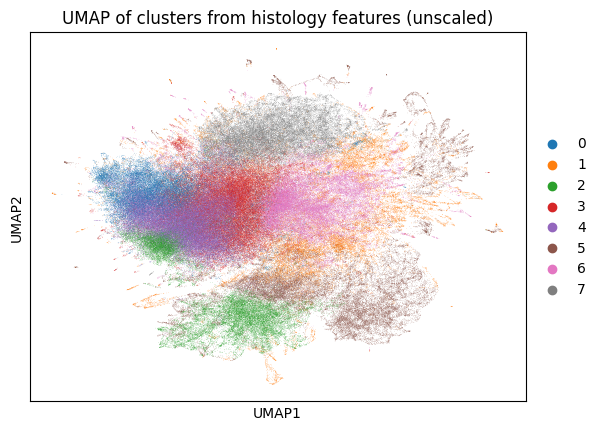

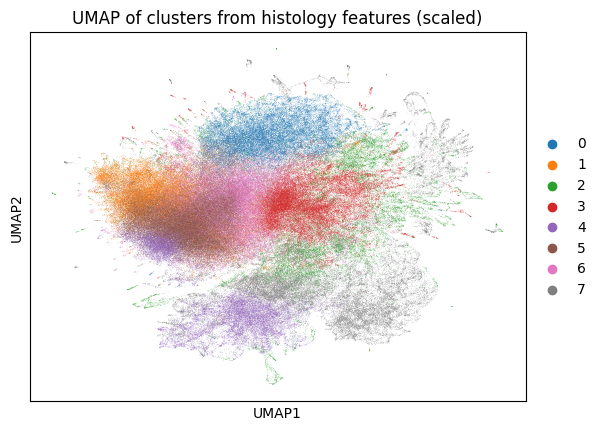

In [67]:
sc.pl.umap(adata_histological_features, color='cluster_8_unscaled', title='UMAP of clusters from histology features (unscaled)')
sc.pl.umap(adata_histological_features, color='cluster_8_scaled', title='UMAP of clusters from histology features (scaled)')

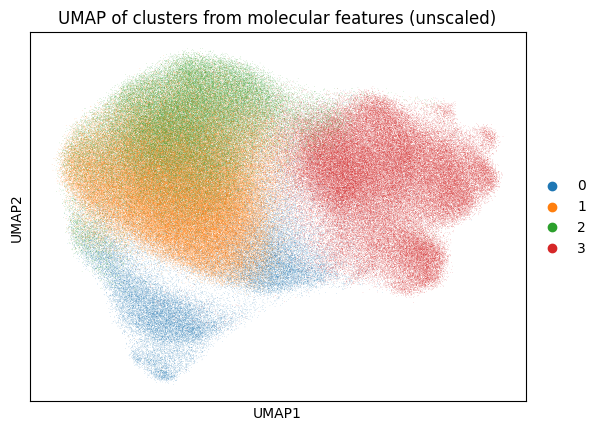

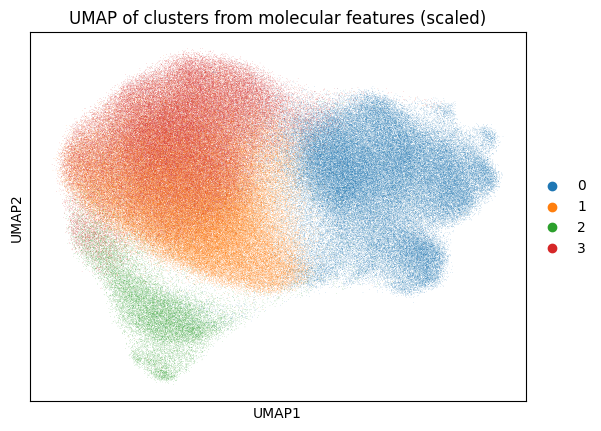

In [68]:
sc.pl.umap(adata_molecular_features, color='cluster_4_unscaled', title='UMAP of clusters from molecular features (unscaled)')
sc.pl.umap(adata_molecular_features, color='cluster_4_scaled', title='UMAP of clusters from molecular features (scaled)')

In [81]:
# Funzione che calcola l'ARI e la NMI tra due colonne di etichette di clustering in un oggetto AnnData.

def evaluate_clustering_agreement(adata, col1, col2, description=""):
     
    # Estrai le etichette come array
    labels1 = adata.obs[col1].to_numpy()
    labels2 = adata.obs[col2].to_numpy()

    # Calcola ARI e NMI
    ari = adjusted_rand_score(labels1, labels2)
    nmi = normalized_mutual_info_score(labels1, labels2)

    # Stampa i risultati
    print(f"\nClustering comparison: {description}")
    print(f"Adjusted Rand Index (ARI): {ari:.3f}")
    print(f"Normalized Mutual Information (NMI): {nmi:.3f}")

# ESEMPIO 1: Molecular features, K=10
evaluate_clustering_agreement(
    adata=adata_molecular_features,
    col1='cluster_10_scaled',
    col2='cluster_10_unscaled',
    description='Molecular Features - K=10')

# ESEMPIO 1: Molecular features, K=4
evaluate_clustering_agreement(
    adata=adata_molecular_features,
    col1='cluster_4_scaled',
    col2='cluster_4_unscaled',
    description='Molecular Features - K=4')

# ESEMPIO 2: Histological features, K=8
evaluate_clustering_agreement(
    adata=adata_histological_features,
    col1='cluster_8_scaled',
    col2='cluster_8_unscaled',
    description='Histological Features - K=8')


Clustering comparison: Molecular Features - K=10
Adjusted Rand Index (ARI): 0.564
Normalized Mutual Information (NMI): 0.712

Clustering comparison: Molecular Features - K=4
Adjusted Rand Index (ARI): 0.659
Normalized Mutual Information (NMI): 0.684

Clustering comparison: Histological Features - K=8
Adjusted Rand Index (ARI): 0.877
Normalized Mutual Information (NMI): 0.889


/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)

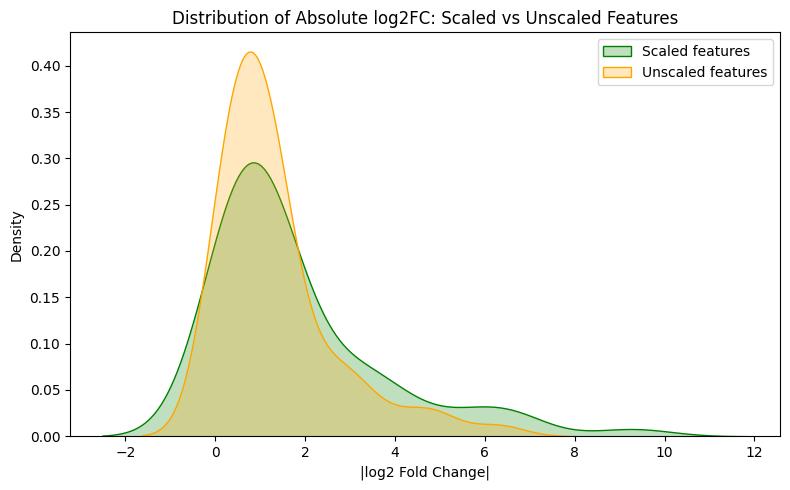


Kolmogorov–Smirnov test: stat = 0.1298, p-value = 6.0698e-01
Mean |log2FC| - Scaled:   1.8042
Mean |log2FC| - Unscaled: 1.3265

Cleaned scaled length:   61
Cleaned unscaled length: 60

Mann–Whitney U test:
  U = 2032.0000, p-value = 2.9621e-01


/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)

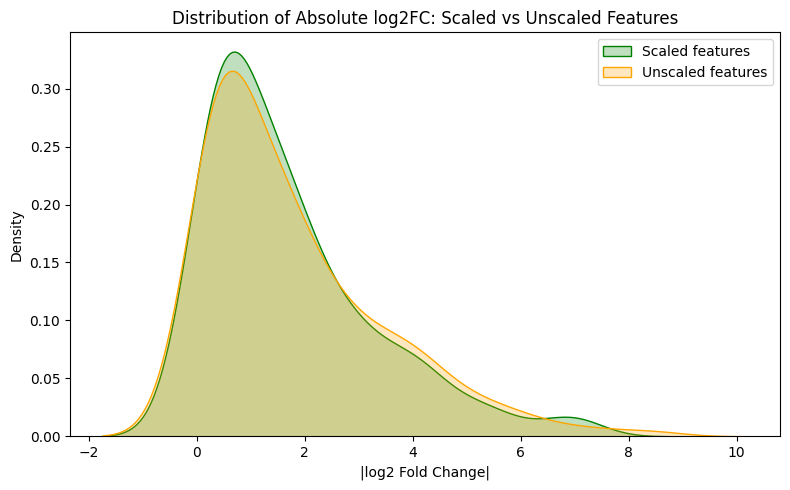


Kolmogorov–Smirnov test: stat = 0.0488, p-value = 9.6854e-01
Mean |log2FC| - Scaled:   1.7115
Mean |log2FC| - Unscaled: 1.7845

Cleaned scaled length:   184
Cleaned unscaled length: 187

Mann–Whitney U test:
  U = 17005.0000, p-value = 8.4759e-01


In [79]:
# Calcolo i log2 fold-change assoluti per ogni cluster vs tutti gli altri

def compute_abs_logfc_per_cluster(adata, cluster_col, features_key):
    
    X = adata.obsm[features_key]
    clusters = adata.obs[cluster_col].astype(str).values
    feature_names = adata.uns[features_key + "_feature_names"]
    
    df = pd.DataFrame(X, columns=feature_names, index=adata.obs_names)
    df['cluster'] = clusters

    abs_logfc_all = []

    for cluster in sorted(df['cluster'].unique()):
        df_cluster = df[df['cluster'] == cluster].drop(columns='cluster')
        df_rest = df[df['cluster'] != cluster].drop(columns='cluster')

        mean_cluster = df_cluster.mean() + 1e-9
        mean_rest = df_rest.mean() + 1e-9

        logfc = np.log2(mean_cluster / mean_rest)
        abs_logfc = np.abs(logfc)
        abs_logfc_all.extend(abs_logfc.values)

    return np.array(abs_logfc_all)

def analyze_logfc_distribution(adata, features_key, cluster_col_scaled, cluster_col_unscaled):
    # Calcola i logFC assoluti
    abs_logfc_scaled = compute_abs_logfc_per_cluster(adata, cluster_col_scaled, features_key)
    abs_logfc_unscaled = compute_abs_logfc_per_cluster(adata, cluster_col_unscaled, features_key)

    # Visualizzazione KDE
    plt.figure(figsize=(8, 5))
    sns.kdeplot(abs_logfc_scaled, label='Scaled features', fill=True, color='green')
    sns.kdeplot(abs_logfc_unscaled, label='Unscaled features', fill=True, color='orange')
    plt.xlabel('|log2 Fold Change|')
    plt.ylabel('Density')
    plt.title('Distribution of Absolute log2FC: Scaled vs Unscaled Features')
    plt.legend()
    plt.grid(False)
    plt.tight_layout()
    plt.show()

    # KS test
    stat, pval = ks_2samp(abs_logfc_scaled[~np.isnan(abs_logfc_scaled)],
                          abs_logfc_unscaled[~np.isnan(abs_logfc_unscaled)])
    print(f"\nKolmogorov–Smirnov test: stat = {stat:.4f}, p-value = {pval:.4e}")

    # Media log2FC
    print(f"Mean |log2FC| - Scaled:   {np.nanmean(abs_logfc_scaled):.4f}")
    print(f"Mean |log2FC| - Unscaled: {np.nanmean(abs_logfc_unscaled):.4f}")

    # Pulizia NaN
    scaled_clean = abs_logfc_scaled[~np.isnan(abs_logfc_scaled)]
    unscaled_clean = abs_logfc_unscaled[~np.isnan(abs_logfc_unscaled)]

    print(f"\nCleaned scaled length:   {len(scaled_clean)}")
    print(f"Cleaned unscaled length: {len(unscaled_clean)}")

    # Mann–Whitney U test
    if len(scaled_clean) > 0 and len(unscaled_clean) > 0:
        stat_mwu, pval_mwu = mannwhitneyu(scaled_clean, unscaled_clean, alternative='two-sided')
        print(f"\nMann–Whitney U test:")
        print(f"  U = {stat_mwu:.4f}, p-value = {pval_mwu:.4e}")
    else:
        print("One of the two arrays is empty after removing the NaNs.")

# Funzione uata in adata_molecular_features
analyze_logfc_distribution(
    adata=adata_molecular_features,
    features_key='molecular_features',
    cluster_col_scaled='molecular_cluster_4_scaled',
    cluster_col_unscaled='cluster_4_unscaled')

analyze_logfc_distribution(
    adata=adata_molecular_features,
    features_key='molecular_features',
    cluster_col_scaled='molecular_cluster_10_scaled',
    cluster_col_unscaled='cluster_10_unscaled')

In [778]:
# --- CLUSTERING A 10 CLUSTER ---
# Scaled
X_scaled = adata_molecular_features.obsm['molecular_features_scaled']
labels_scaled_10 = adata_molecular_features.obs['molecular_cluster_10_scaled'].astype(int)
sil_scaled_10 = silhouette_score(X_scaled, labels_scaled_10)

# Unscaled
X_unscaled = adata_molecular_features.obsm['molecular_features']
labels_unscaled_10 = adata_molecular_features.obs['cluster_10_unscaled'].astype(int)
sil_unscaled_10 = silhouette_score(X_unscaled, labels_unscaled_10)

# --- CLUSTERING A 4 CLUSTER ---
# Scaled
labels_scaled_4 = adata_molecular_features.obs['molecular_cluster_4_scaled'].astype(int)
sil_scaled_4 = silhouette_score(X_scaled, labels_scaled_4)

# Unscaled
labels_unscaled_4 = adata_molecular_features.obs['cluster_4_unscaled'].astype(int)
sil_unscaled_4 = silhouette_score(X_unscaled, labels_unscaled_4)

# --- RISULTATI ---
print(f"Silhouette Score (10 clusters - scaled):   {sil_scaled_10:.4f}")
print(f"Silhouette Score (10 clusters - unscaled): {sil_unscaled_10:.4f}")
print(f"Silhouette Score (4 clusters - scaled):    {sil_scaled_4:.4f}")
print(f"Silhouette Score (4 clusters - unscaled):  {sil_unscaled_4:.4f}")

Silhouette Score (10 clusters - scaled):   -0.0380
Silhouette Score (10 clusters - unscaled): -0.0343
Silhouette Score (4 clusters - scaled):    0.0051
Silhouette Score (4 clusters - unscaled):  -0.0239


In [ ]:
# Organizza i dati in un DataFrame
silhouette_data = pd.DataFrame({
    'Setting': [
        '10 clusters (scaled)',
        '10 clusters (unscaled)',
        '4 clusters (scaled)',
        '4 clusters (unscaled)'
    ],
    'Silhouette Score': [
        sil_scaled_10,
        sil_unscaled_10,
        sil_scaled_4,
        sil_unscaled_4
    ]
})

# Barplot
plt.figure(figsize=(8, 5))
sns.barplot(data=silhouette_data, x='Setting', y='Silhouette Score', palette='Blues_d')
plt.title('Silhouette Scores for Clustering Settings')
plt.ylabel('Silhouette Score')
plt.ylim(0, 1)
plt.xticks(rotation=20)
plt.grid(axis='y')
plt.tight_layout()
plt.savefig('figures/silhouette_scores_barplot.pdf', format='pdf')
plt.show()

In [ ]:
# con le nuove features 
# (specifiche del campione che sto usando xenium e non sono un insieme dei 6 campioni e inoltre sono specifiche solo delle cellule epiteliali) 
# fare clustering con GMM con k=2 e vedere se si dividono in due gruppi separati oppure no

In [85]:
# Funzione per applicare GMM clustering (default k=2) sulle feature specificate e salva i risultati in obs.

def run_gmm_clustering_on_features(
    adata,
    feature_key: str,
    cluster_key: str = 'gmm_single_clusters',
    n_components: int = 2,
    random_state: int = 42,
    compute_umap: bool = True):

    # 1. Estraggo le feature
    X = adata.obsm[feature_key]

    # 2. Applico GMM
    gmm = GaussianMixture(n_components=n_components, covariance_type='full', random_state=random_state)
    clusters = gmm.fit_predict(X)

    # 3. Salvo i cluster in obs
    adata.obs[cluster_key] = clusters.astype(str)  # salva come stringa per compatibilità grafici
    adata.obs[cluster_key] = adata.obs[cluster_key].astype("category")

    # 4. Calcolo neighbors + UMAP
    if compute_umap:
        sc.pp.neighbors(adata, use_rep=feature_key)
        sc.tl.umap(adata)

    print(f"GMM clustering con {n_components} cluster salvato in adata.obs['{cluster_key}']")

In [86]:
# MOLECULAR FEATURES
run_gmm_clustering_on_features(
    adata=adata_molecular_features,
    feature_key='molecular_features',
    cluster_key='GMM_clusters')

# MOLECULAR SINGLE FEATURES
run_gmm_clustering_on_features(
    adata=adata_molecular_single_features,
    feature_key='molecular_single_features',
    cluster_key='GMM_single_clusters')

# HISTOLOGICAL FEATURES
run_gmm_clustering_on_features(
    adata=adata_histological_features,
    feature_key='histological_features',
    cluster_key='GMM_clusters')

# HISTOLOGICAL SINGLE FEATURES
run_gmm_clustering_on_features(
    adata=adata_histological_single_features,
    feature_key='histological_single_features',
    cluster_key='GMM_single_clusters')

GMM clustering con 2 cluster salvato in adata.obs['GMM_clusters']
GMM clustering con 2 cluster salvato in adata.obs['GMM_single_clusters']
GMM clustering con 2 cluster salvato in adata.obs['GMM_clusters']
GMM clustering con 2 cluster salvato in adata.obs['GMM_single_clusters']


In [91]:
# Funzione per plottare due UMAP side-by-side:     - sinistra: GMM clustering     - destra: predizione del tipo cellulare

def plot_umap_gmm_vs_celltype(
    adata,
    cluster_key='gmm_clusters',
    cluster_palette=['blue', 'red'],
    celltype_palette={'Normal': 'blue', 'Malignant': 'red', 'Unknown': 'black'},
    title_left='GMM Clustering (k=2)',
    title_right='Cell Type Prediction',
    figsize=(12, 5),
    save_path=None):

    fig, axes = plt.subplots(1, 2, figsize=figsize)

    # GMM Clustering
    sc.pl.umap(
        adata,
        color=cluster_key,
        palette=cluster_palette,
        title=title_left,
        ax=axes[0],
        show=False    )

    # Cell Type Prediction
    sc.pl.umap(
        adata,
        color='cell_type_prediction',
        palette=celltype_palette,
        title=title_right,
        ax=axes[1],
        show=False    )

    plt.tight_layout()
    if save_path:
        fig.savefig(save_path, dpi=300)
    plt.show()

In [92]:
# FUNZIONE per plottare due UMAP affiancati: a sinistra GMM clustering con Unknown evidenziate, a destra solo Unknown in rosso.

def plot_gmm_vs_unknown_highlight(
    adata,
    feature_key: str,
    cluster_key: str = 'GMM_cluster',
    title_left: str = 'GMM clustering of Unknown cells (highlighted)',
    title_right: str = 'Cell Type Prediction (highlight Unknown)',
    save_path: str = None):
   
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))

    # Maschere
    mask_known = adata.obs['cell_type_prediction'].isin(['Normal', 'Malignant'])
    mask_unknown = adata.obs['cell_type_prediction'] == 'Unknown'

    # --- SINISTRA ---
    sc.pl.umap(
        adata[mask_known],
        color='cell_type_prediction',
        palette={'Normal': 'lightgray', 'Malignant': 'lightgray'},
        size=10,
        alpha=0.3,
        ax=axes[0],
        show=False,
        legend_loc=None)
    sc.pl.umap(
        adata[mask_unknown],
        color=cluster_key,
        palette=['blue', 'red'],
        size=10,
        alpha=0.5,
        ax=axes[0],
        show=False,
        legend_loc='right')
    axes[0].set_title(title_left)
    axes[0].legend(loc='center left', bbox_to_anchor=(1, 0.5), title='GMM cluster')

    # --- DESTRA ---
    sc.pl.umap(
        adata,
        color='cell_type_prediction',
        palette={'Normal': 'lightgray', 'Malignant': 'lightgray', 'Unknown': 'lightgray'},
        size=10,
        alpha=0.5,
        ax=axes[1],
        show=False,
        legend_loc=None)
    sc.pl.umap(
        adata[mask_unknown],
        color='cell_type_prediction',
        palette={'Unknown': 'red'},
        size=10,
        alpha=0.5,
        ax=axes[1],
        show=False)
    axes[1].set_title(title_right)

    plt.tight_layout()
    if save_path:
        fig.savefig(save_path, dpi=300)
    plt.show()

In [93]:
# Funzione per plottare un barplot che mostra come le cellule Unknown sono state classificate dai cluster GMM
def plot_gmm_classification_of_unknowns(
    adata,
    cluster_col: str,
    cell_type_col: str = 'cell_type_prediction',
    unknown_label: str = 'Unknown',
    cluster_label_map: dict = None,
    palette: list = ['blue', 'red'],
    title: str = 'GMM Classification of Unknown Cell Types'):
  
    # Filtro le cellule Unknown
    unknown_cells = adata[adata.obs[cell_type_col] == unknown_label]

    # Conto le occorrenze dei cluster nelle Unknown
    counts = unknown_cells.obs[cluster_col].value_counts().sort_index()

    # Se è presente la mappa per i cluster, rimappo gli indici
    if cluster_label_map is not None:
        counts.index = counts.index.map(cluster_label_map)

    # Preparo il dataframe per seaborn
    df_plot = unknown_cells.obs[[cluster_col]].copy()
    if cluster_label_map is not None:
        df_plot['cluster_label'] = df_plot[cluster_col].map(cluster_label_map)
    else:
        df_plot['cluster_label'] = df_plot[cluster_col]

    # Plot
    plt.figure(figsize=(6,4))
    desired_order = ['Malignant', 'Normal']  
    desired_palette = {'Malignant': 'red', 'Normal': 'blue'}
    
    ax = sns.countplot(data=df_plot, x='cluster_label', order=desired_order, palette=desired_palette)

    plt.ylabel('Number of Unknown Cells')
    plt.title(title)

    # Aggiunta delle etichette sopra le barre
    for p in ax.patches:
        height = p.get_height()
        ax.text(p.get_x() + p.get_width()/2., height + 1, int(height), ha="center", fontsize=10)

    plt.tight_layout()
    plt.show()

In [98]:
# Funzione per plottare un barplot che mostra come le cellule Unknown sono state classificate dai cluster GMM.
def plot_gmm_classification_of_unknowns(
    adata,
    cluster_col: str,
    cell_type_col: str = 'cell_type_prediction',
    unknown_label: str = 'Unknown',
    cluster_label_map: dict = None,
    palette: list = ['blue', 'red'],
    title: str = 'GMM Classification of Unknown Cell Types',
    save_path: str = None):
   
    unknown_cells = adata[adata.obs[cell_type_col] == unknown_label]

    # Converto il tipo in int (se possibile)
    cluster_data = unknown_cells.obs[cluster_col].copy()
    try:
        cluster_data = cluster_data.astype(int)
    except (ValueError, TypeError):
        pass

    if cluster_label_map is not None:
        cluster_data_mapped = cluster_data.map(cluster_label_map)
    else:
        cluster_data_mapped = cluster_data

    df_plot = pd.DataFrame({'gmm_cluster_label': cluster_data_mapped})

    # Imposto ordine desiderato (Malignant a destra)
    desired_order = ['Malignant', 'Normal']
    desired_palette = {'Malignant': 'red', 'Normal': 'blue'}

    plt.figure(figsize=(6,4))
    ax = sns.countplot(data=df_plot, x='gmm_cluster_label',
                       order=desired_order, palette=desired_palette)

    plt.ylabel('Number of Unknown Cells')
    plt.title(title)

    for p in ax.patches:
        height = p.get_height()
        ax.text(p.get_x() + p.get_width()/2., height + 1,
                int(height), ha="center", fontsize=10)

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300)

    plt.show()

cell_type_prediction  Malignant  Normal  Unknown
GMM_clusters                                    
0                        155726   17164     2983
1                        164648    8299     1898


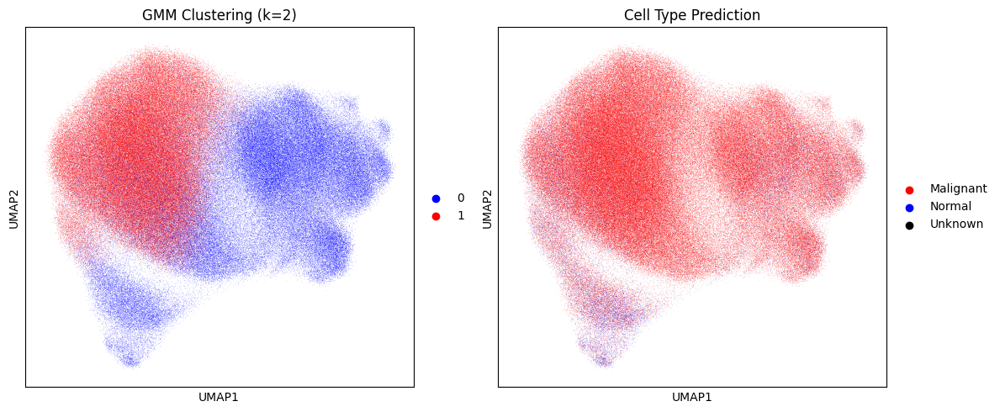

/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:491: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:491: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:491: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


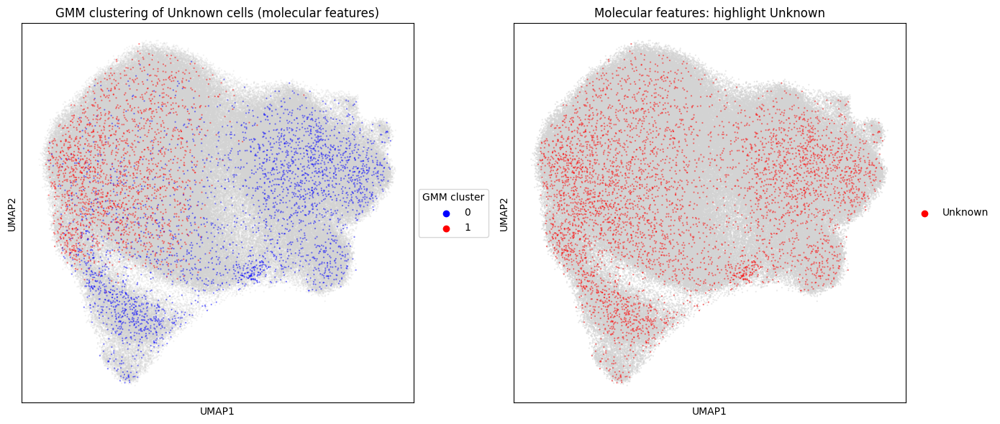

/tmp/ipykernel_1097759/727457632.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(data=df_plot, x='gmm_cluster_label',


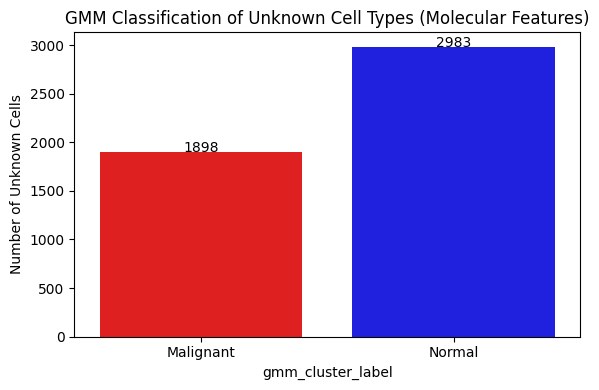

In [99]:
# VISUALIZZAZIONE DI MOLECULAR FEATURES
adata_molecular_features.obs["GMM_clusters"].value_counts()
print(pd.crosstab(adata_molecular_features.obs["GMM_clusters"],
            adata_molecular_features.obs["cell_type_prediction"]))


plot_umap_gmm_vs_celltype(
    adata=adata_molecular_features,
    cluster_key='GMM_clusters',
    cluster_palette=['blue', 'red'],
    celltype_palette={'Normal': 'blue', 'Malignant': 'red', 'Unknown': 'black'},
    title_left='GMM Clustering (k=2)',
    title_right='Cell Type Prediction',
    save_path='figures/umap_gmm_vs_celltype_molecular.png')


plot_gmm_vs_unknown_highlight(
    adata=adata_molecular_features,
    feature_key='molecular_features',      
    cluster_key='GMM_clusters',               
    title_left='GMM clustering of Unknown cells (molecular features)',
    title_right='Molecular features: highlight Unknown',
    save_path='figures/umap_molecular_gmm_vs_unknown.png')


plot_gmm_classification_of_unknowns(
    adata=adata_molecular_features,
    cluster_col='GMM_clusters',
    cell_type_col='cell_type_prediction',
    unknown_label='Unknown',
    cluster_label_map={0: 'Normal', 1: 'Malignant'},
    palette=['blue', 'red'],
    title='GMM Classification of Unknown Cell Types (Molecular Features)')

cell_type_prediction  Malignant  Normal  Unknown
GMM_single_clusters                             
0                        232873     150      459
1                         87511   25313     4423


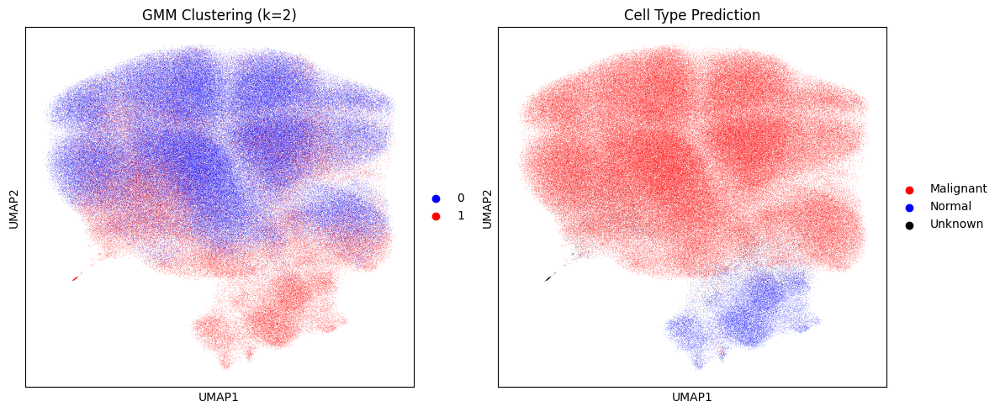

/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:491: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:491: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:491: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


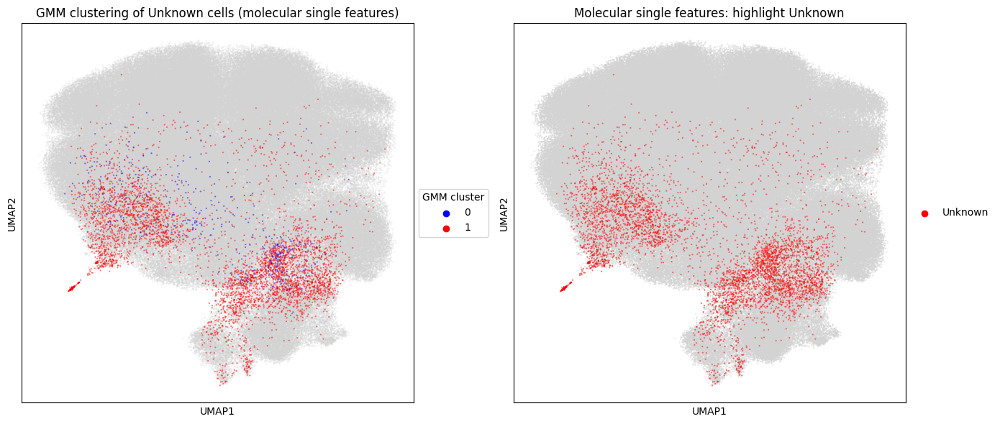

/tmp/ipykernel_1097759/727457632.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(data=df_plot, x='gmm_cluster_label',


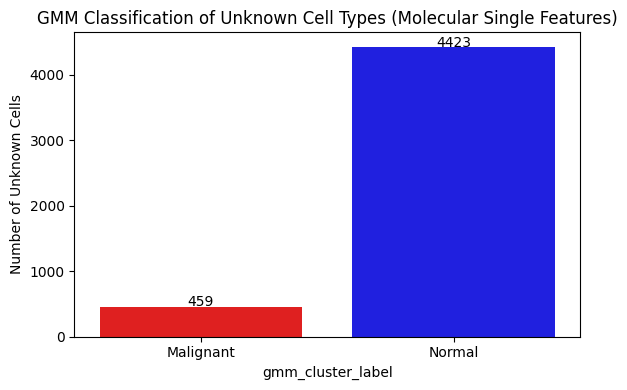

In [100]:
# VISUALIZZAZIONE DI MOLECULAR SINGLE FEATURES 
adata_molecular_single_features.obs["GMM_single_clusters"].value_counts()
print(pd.crosstab(
    adata_molecular_single_features.obs["GMM_single_clusters"],
    adata_molecular_single_features.obs["cell_type_prediction"]))


plot_umap_gmm_vs_celltype(
    adata=adata_molecular_single_features,
    cluster_key='GMM_single_clusters',
    cluster_palette=['blue', 'red'],
    celltype_palette={'Normal': 'blue', 'Malignant': 'red', 'Unknown': 'black'},
    title_left='GMM Clustering (k=2)',
    title_right='Cell Type Prediction',
    save_path='figures/umap_gmm_vs_celltype_molecular_single_features.png')


plot_gmm_vs_unknown_highlight(
    adata=adata_molecular_single_features,
    feature_key='molecular_single_features',
    cluster_key='GMM_single_clusters',
    title_left='GMM clustering of Unknown cells (molecular single features)',
    title_right='Molecular single features: highlight Unknown',
    save_path='figures/umap_molecular_single_features_gmm_vs_unknown.png')


plot_gmm_classification_of_unknowns(
    adata=adata_molecular_single_features,
    cluster_col='GMM_single_clusters',
    cell_type_col='cell_type_prediction',
    unknown_label='Unknown',
    cluster_label_map={0: 'Malignant', 1: 'Normal'},
    palette=['red', 'blue'],
    title='GMM Classification of Unknown Cell Types (Molecular Single Features)',
    save_path='figures/barplot_gmm_molecular_single_features_unknowns.png')

In [119]:
#  MOLECULAR SINGLE FEATURES DOWNSAMPLING

# 1. Filtra le cellule Normal, Malignant, Unknown
mask = adata_molecular_single_features.obs['cell_type_prediction'].isin(['Normal', 'Malignant', 'Unknown'])
adata_filtered = adata_molecular_single_features[mask].copy()

# 2. Estrai i gruppi separatamente
normal_cells = adata_filtered[adata_filtered.obs['cell_type_prediction'] == 'Normal']
malignant_cells = adata_filtered[adata_filtered.obs['cell_type_prediction'] == 'Malignant']
unknown_cells = adata_filtered[adata_filtered.obs['cell_type_prediction'] == 'Unknown']

# 3. Subsampling: 25.000 Normal + 25.000 Malignant
normal_sample = normal_cells[np.random.choice(normal_cells.shape[0], 25000, replace=False)].copy()
malignant_sample = malignant_cells[np.random.choice(malignant_cells.shape[0], 25000, replace=False)].copy()

# 4. Combina i dati: 25k Normal + 25k Malignant + tutte le Unknown
molecular_single_features_downsampling = normal_sample.concatenate(malignant_sample, unknown_cells)

# 5. Estrai le feature istologiche
X = molecular_single_features_downsampling.obsm["molecular_single_features"]

# 6. GMM clustering (2 componenti)
gmm = GaussianMixture(n_components=2, covariance_type='full', random_state=42)
gmm_labels = gmm.fit_predict(X)
molecular_single_features_downsampling.obs["gmm_single_clusters_down"] = gmm_labels.astype(str)

# 7. Calcola vicini e UMAP
sc.pp.neighbors(molecular_single_features_downsampling, use_rep="molecular_single_features")
sc.tl.umap(molecular_single_features_downsampling)

NameError: name 'seed' is not defined

cell_type_prediction      Malignant  Normal  Unknown
gmm_single_clusters_down                            
0                               488   24625     2976
1                             24512     375     1906


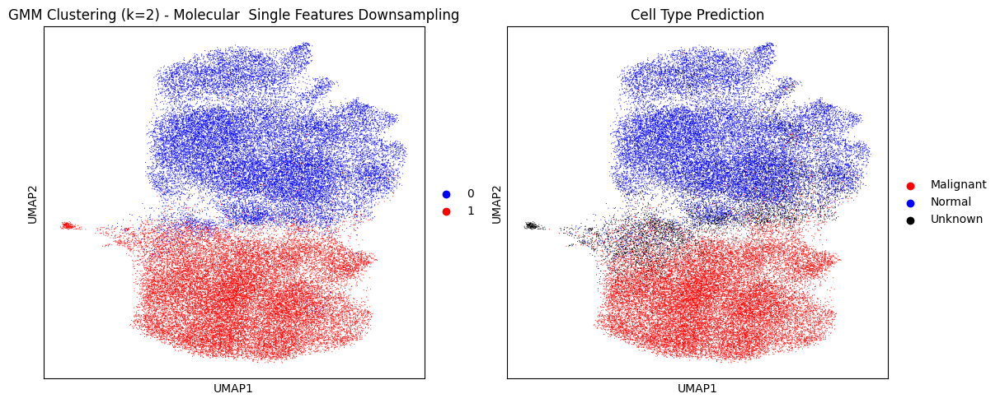

/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:491: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:491: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:491: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


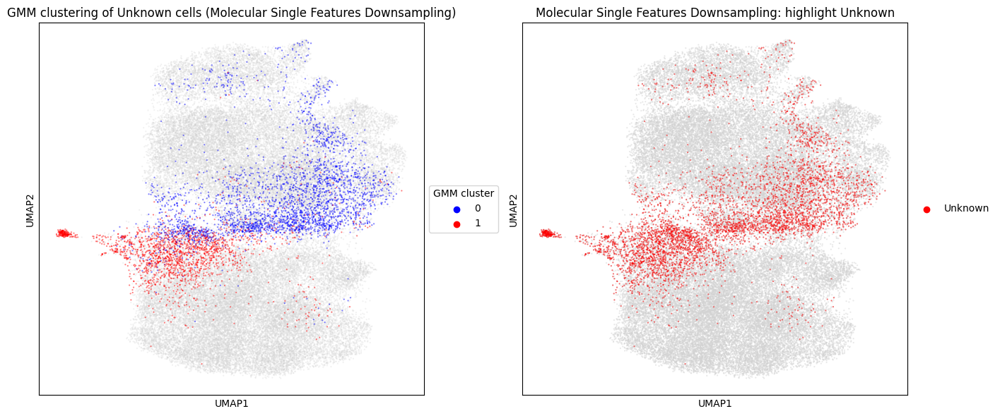

/tmp/ipykernel_1097759/727457632.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(data=df_plot, x='gmm_cluster_label',


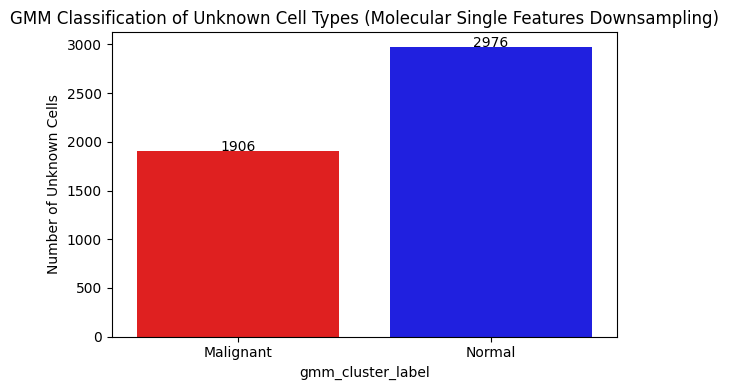

In [118]:
# VISUALIZZAZIONE DI MOLECULAR SINGLE FEATURES DOWNSAMPLING
molecular_single_features_downsampling.obs["gmm_single_clusters_down"].value_counts()
print(pd.crosstab(
    molecular_single_features_downsampling.obs["gmm_single_clusters_down"],
    molecular_single_features_downsampling.obs["cell_type_prediction"]))

plot_umap_gmm_vs_celltype(
    adata=molecular_single_features_downsampling,
    cluster_key='gmm_single_clusters_down',
    cluster_palette=['blue', 'red'],
    celltype_palette={'Normal': 'blue', 'Malignant': 'red', 'Unknown': 'black'},
    title_left='GMM Clustering (k=2) - Molecular  Single Features Downsampling',
    title_right='Cell Type Prediction',
    save_path='figures/umap_gmm_vs_celltype_molecular_single_features_downsampling.png')

plot_gmm_vs_unknown_highlight(
    adata=molecular_single_features_downsampling,
    feature_key='molecular_single_features',
    cluster_key='gmm_single_clusters_down',
    title_left='GMM clustering of Unknown cells (Molecular Single Features Downsampling)',
    title_right='Molecular Single Features Downsampling: highlight Unknown',
    save_path='figures/umap_molecular_single_features_downsampling_gmm_vs_unknown.png')

plot_gmm_classification_of_unknowns(
    adata=molecular_single_features_downsampling,
    cluster_col='gmm_single_clusters_down',
    cell_type_col='cell_type_prediction',
    unknown_label='Unknown',
    cluster_label_map={0: 'Normal', 1: 'Malignant'},
    palette=['blue', 'red'],
    title='GMM Classification of Unknown Cell Types (Molecular Single Features Downsampling)',
    save_path='figures/barplot_gmm_molecular_single_features_downsampling_unknowns.png')

In [120]:
from sklearn.metrics import adjusted_rand_score

# Estrai le etichette predette dai cluster GMM (converti in int se sono categorie)
pred_labels = molecular_single_features_downsampling.obs["gmm_single_clusters_down"].astype(int)

# Estrai le etichette vere (ad esempio da 'cell_type_prediction')
# Nota: devi assicurarti che siano codificate come numeri o mappate a valori numerici
true_labels = molecular_single_features_downsampling.obs["cell_type_prediction"]

# Se 'cell_type_prediction' è una stringa, convertila in numeri con una mappa
# Es. {'Normal':0, 'Malignant':1, 'Unknown':2} a seconda dei tuoi dati
label_map = {'Normal': 0, 'Malignant': 1, 'Unknown': 2}
true_labels_num = true_labels.map(label_map)

# Calcola ARI
ari_score = adjusted_rand_score(true_labels_num, pred_labels)
print(f"Adjusted Rand Index (ARI) between GMM clusters and true labels: {ari_score:.4f}")

Adjusted Rand Index (ARI) between GMM clusters and true labels: 0.7739


cell_type_prediction  Malignant  Normal  Unknown
GMM_clusters                                    
0                        119986    4109     1101
1                        200388   21354     3780


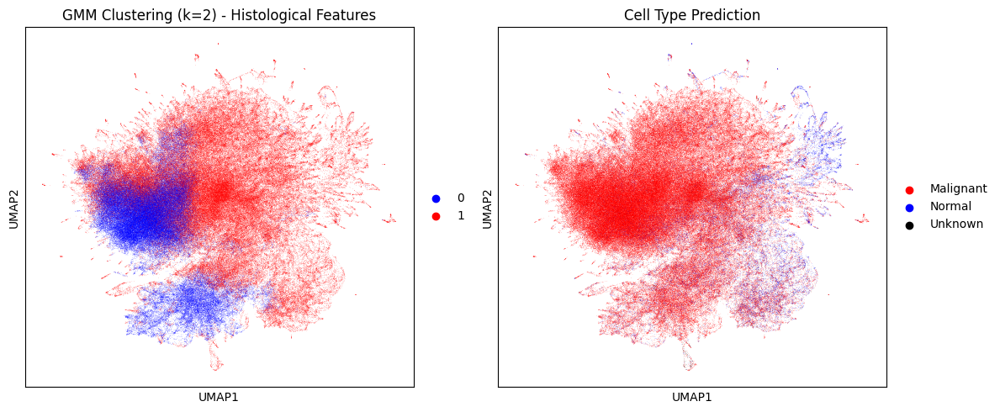

/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:491: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:491: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:491: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


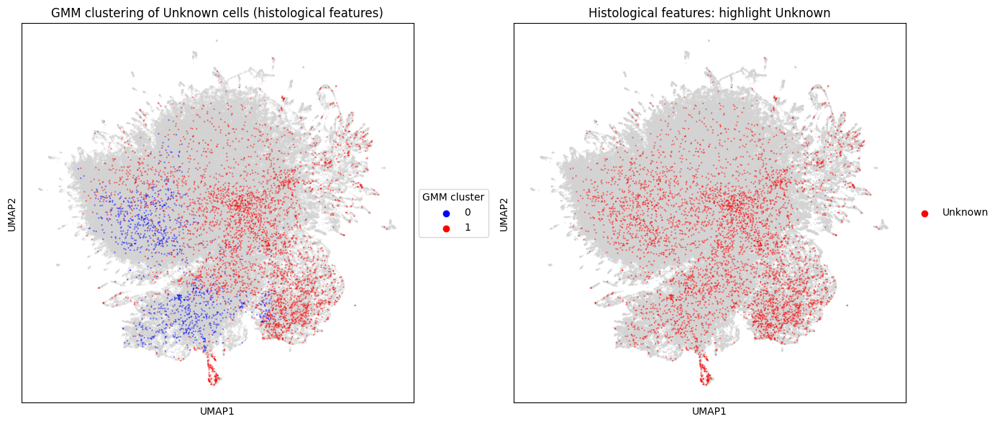

/tmp/ipykernel_1097759/727457632.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(data=df_plot, x='gmm_cluster_label',


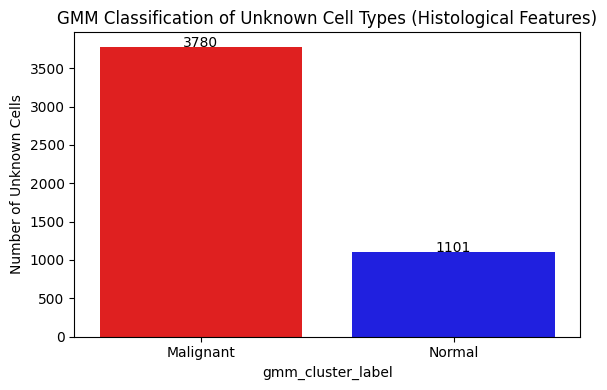

In [104]:
# VISUALIZZAZIONE DI HISTOLOGICAL FEATURES
adata_histological_features.obs["GMM_clusters"].value_counts()
print(pd.crosstab(
    adata_histological_features.obs["GMM_clusters"],
    adata_histological_features.obs["cell_type_prediction"]))

plot_umap_gmm_vs_celltype(
    adata=adata_histological_features,
    cluster_key='GMM_clusters',
    cluster_palette=['blue', 'red'],
    celltype_palette={'Normal': 'blue', 'Malignant': 'red', 'Unknown': 'black'},
    title_left='GMM Clustering (k=2) - Histological Features',
    title_right='Cell Type Prediction',
    save_path='figures/umap_gmm_vs_celltype_histological.png')

plot_gmm_vs_unknown_highlight(
    adata=adata_histological_features,
    feature_key='histological_features',
    cluster_key='GMM_clusters',
    title_left='GMM clustering of Unknown cells (histological features)',
    title_right='Histological features: highlight Unknown',
    save_path='figures/umap_histological_gmm_vs_unknown.png')

plot_gmm_classification_of_unknowns(
    adata=adata_histological_features,
    cluster_col='GMM_clusters',
    cell_type_col='cell_type_prediction',
    unknown_label='Unknown',
    cluster_label_map={0: 'Normal', 1: 'Malignant'},
    palette=['blue', 'red'],
    title='GMM Classification of Unknown Cell Types (Histological Features)',
    save_path='figures/barplot_gmm_histological_unknowns.png')

cell_type_prediction  Malignant  Normal  Unknown
GMM_single_clusters                             
0                        143436    3413     1753
1                        176948   22050     2969


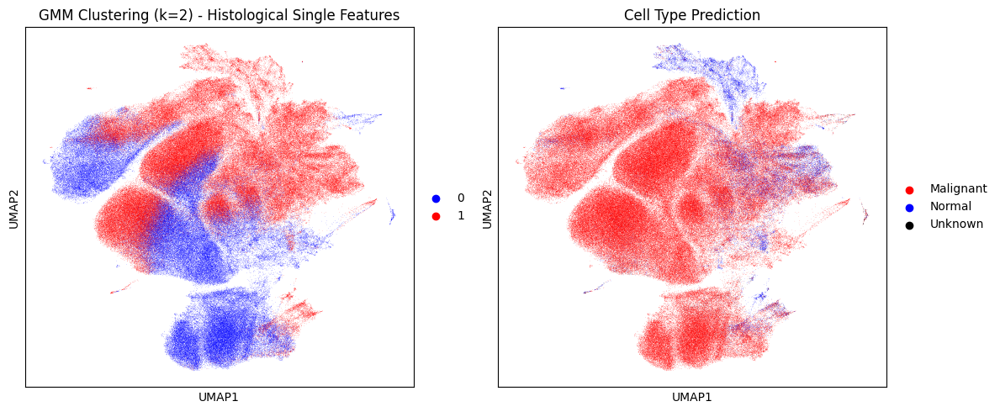

/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:491: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:491: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:491: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


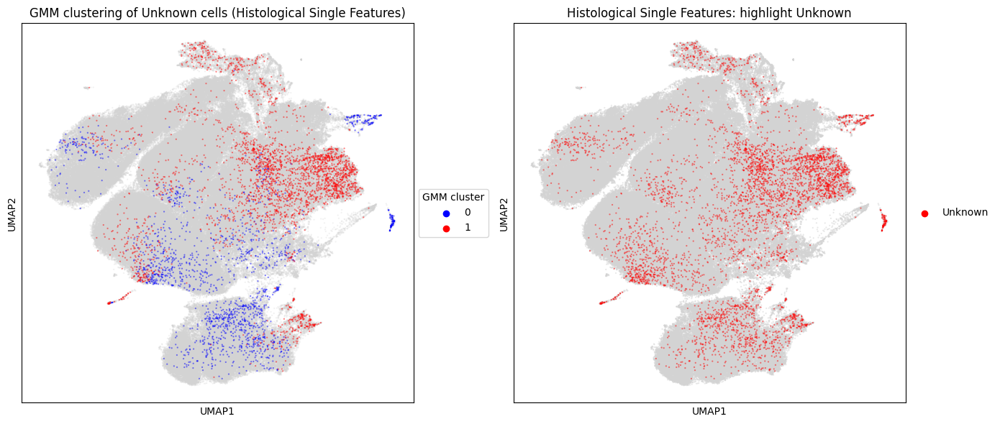

/tmp/ipykernel_1097759/727457632.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(data=df_plot, x='gmm_cluster_label',


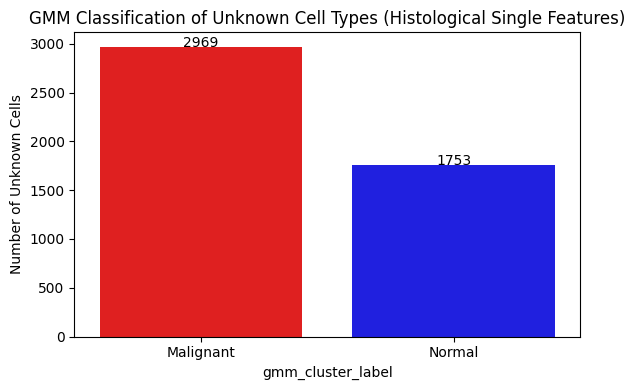

In [112]:
# VISUALIZZAZIONE DI HISTOLOGICAL SINGLE FEATURES
adata_histological_single_features.obs["GMM_single_clusters"].value_counts()
print(pd.crosstab(
    adata_histological_single_features.obs["GMM_single_clusters"],
    adata_histological_single_features.obs["cell_type_prediction"]))

plot_umap_gmm_vs_celltype(
    adata=adata_histological_single_features,
    cluster_key='GMM_single_clusters',
    cluster_palette=['blue', 'red'],
    celltype_palette={'Normal': 'blue', 'Malignant': 'red', 'Unknown': 'black'},
    title_left='GMM Clustering (k=2) - Histological Single Features',
    title_right='Cell Type Prediction',
    save_path='figures/umap_gmm_vs_celltype_histological_single_features.png')

plot_gmm_vs_unknown_highlight(
    adata=adata_histological_single_features,
    feature_key='histological_single_features',
    cluster_key='GMM_single_clusters',
    title_left='GMM clustering of Unknown cells (Histological Single Features)',
    title_right='Histological Single Features: highlight Unknown',
    save_path='figures/umap_histological_single_features_gmm_vs_unknown.png')

plot_gmm_classification_of_unknowns(
    adata=adata_histological_single_features,
    cluster_col='GMM_single_clusters',
    cell_type_col='cell_type_prediction',
    unknown_label='Unknown',
    cluster_label_map={0: 'Normal', 1: 'Malignant'},
    palette=['blue', 'red'],
    title='GMM Classification of Unknown Cell Types (Histological Single Features)',
    save_path='figures/barplot_gmm_histological_single_features_unknowns.png')


In [110]:
# SUBSAMPLING SINGLE FEATURES ISTOLOGIA (25.000 M + 25.000 N + UNKNOWN)


# 1. Filtra le cellule Normal, Malignant, Unknown
mask = adata_histological_single_features.obs['cell_type_prediction'].isin(['Normal', 'Malignant', 'Unknown'])
adata_filtered = adata_histological_single_features[mask].copy()

# 2. Estrai i gruppi separatamente
normal_cells = adata_filtered[adata_filtered.obs['cell_type_prediction'] == 'Normal']
malignant_cells = adata_filtered[adata_filtered.obs['cell_type_prediction'] == 'Malignant']
unknown_cells = adata_filtered[adata_filtered.obs['cell_type_prediction'] == 'Unknown']

# 3. Subsampling: 25.000 Normal + 25.000 Malignant
normal_sample = normal_cells[np.random.choice(normal_cells.shape[0], 25000, replace=False)].copy()
malignant_sample = malignant_cells[np.random.choice(malignant_cells.shape[0], 25000, replace=False)].copy()

# 4. Combina i dati: 25k Normal + 25k Malignant + tutte le Unknown
histological_single_features_downsampling = normal_sample.concatenate(malignant_sample, unknown_cells)

# 5. Estrai le feature istologiche
X = histological_single_features_downsampling.obsm["histological_single_features"]

# 6. GMM clustering (2 componenti)
gmm = GaussianMixture(n_components=2, covariance_type='full', random_state=42)
gmm_labels = gmm.fit_predict(X)
histological_single_features_downsampling.obs["gmm_single_clusters_downsampling"] = gmm_labels.astype(str)

# 7. Calcola vicini e UMAP
sc.pp.neighbors(histological_single_features_downsampling, use_rep="histological_single_features")
sc.tl.umap(histological_single_features_downsampling)

/tmp/ipykernel_1097759/909565246.py:18: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  histological_single_features_downsampling = normal_sample.concatenate(malignant_sample, unknown_cells)


cell_type_prediction              Malignant  Normal  Unknown
gmm_single_clusters_downsampling                            
0                                      3518   21828     2760
1                                     21482    3172     1962


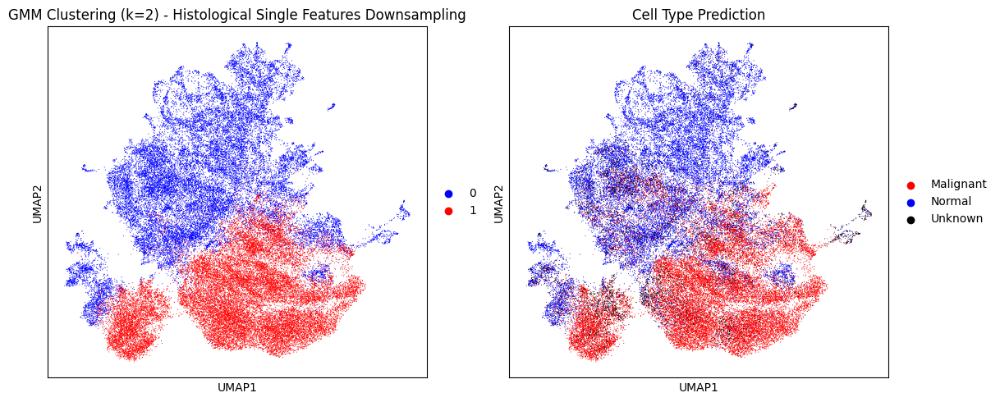

/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:491: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:491: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:491: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


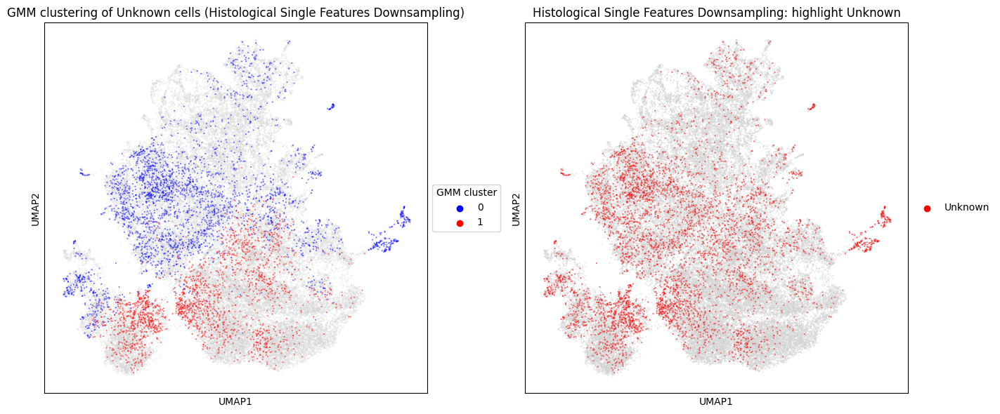

/tmp/ipykernel_1097759/727457632.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(data=df_plot, x='gmm_cluster_label',


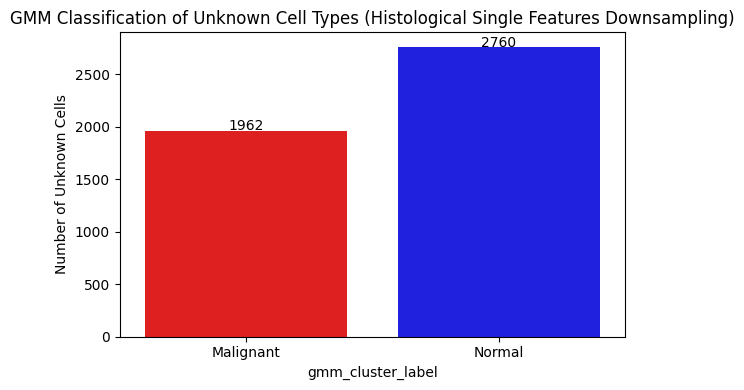

In [111]:
# VISUALIZZAZIONE DI HISTOLOGICAL SINGLE FEATURES DOWNSAMPLING
histological_single_features_downsampling.obs["gmm_single_clusters_downsampling"].value_counts()
print(pd.crosstab(
    histological_single_features_downsampling.obs["gmm_single_clusters_downsampling"],
    histological_single_features_downsampling.obs["cell_type_prediction"]))

plot_umap_gmm_vs_celltype(
    adata=histological_single_features_downsampling,
    cluster_key='gmm_single_clusters_downsampling',
    cluster_palette=['blue', 'red'],
    celltype_palette={'Normal': 'blue', 'Malignant': 'red', 'Unknown': 'black'},
    title_left='GMM Clustering (k=2) - Histological Single Features Downsampling',
    title_right='Cell Type Prediction',
    save_path='figures/umap_gmm_vs_celltype_histological_single_features_downsampling.png')

plot_gmm_vs_unknown_highlight(
    adata=histological_single_features_downsampling,
    feature_key='histological_single_features',
    cluster_key='gmm_single_clusters_downsampling',
    title_left='GMM clustering of Unknown cells (Histological Single Features Downsampling)',
    title_right='Histological Single Features Downsampling: highlight Unknown',
    save_path='figures/umap_histological_single_features_downsampling_gmm_vs_unknown.png')

plot_gmm_classification_of_unknowns(
    adata=histological_single_features_downsampling,
    cluster_col='gmm_single_clusters_downsampling',
    cell_type_col='cell_type_prediction',
    unknown_label='Unknown',
    cluster_label_map={0: 'Normal', 1: 'Malignant'},
    palette=['blue', 'red'],
    title='GMM Classification of Unknown Cell Types (Histological Single Features Downsampling)',
    save_path='figures/barplot_gmm_histological_single_features_downsampling_unknowns.png')

In [122]:
from sklearn.metrics import adjusted_rand_score

# Estrai le etichette predette dai cluster GMM (converti in int se sono categorie)
pred_labels = histological_single_features_downsampling.obs["gmm_single_clusters_downsampling"].astype(int)

# Estrai le etichette vere (ad esempio da 'cell_type_prediction')
# Nota: devi assicurarti che siano codificate come numeri o mappate a valori numerici
true_labels = histological_single_features_downsampling.obs["cell_type_prediction"]

# Se 'cell_type_prediction' è una stringa, convertila in numeri con una mappa
# Es. {'Normal':0, 'Malignant':1, 'Unknown':2} a seconda dei tuoi dati
label_map = {'Normal': 0, 'Malignant': 1, 'Unknown': 2}
true_labels_num = true_labels.map(label_map)

# Calcola ARI
ari_score = adjusted_rand_score(true_labels_num, pred_labels)
print(f"Adjusted Rand Index (ARI) between GMM clusters and true labels: {ari_score:.4f}")


Adjusted Rand Index (ARI) between GMM clusters and true labels: 0.4477


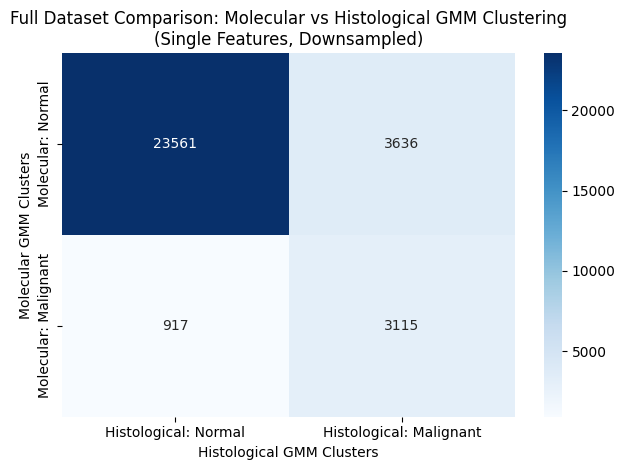

In [794]:
# Confususion matrix tra molecola single feature downsampling e histological single features downsampling

# Confusion matrix tra molecola single feature downsampling e histological single features downsampling
# (su tutte le cellule in comune)

# 1. Trova i nomi delle cellule in comune
common_cells = molecular_single_features_downsampling.obs_names.intersection(
    histological_single_features_downsampling.obs_names)

# 2. Filtra entrambi i dataset
mol_aligned = molecular_single_features_downsampling[common_cells].copy()
hist_aligned = histological_single_features_downsampling[common_cells].copy()

# 3. Verifica che ora i nomi siano allineati
assert all(mol_aligned.obs_names == hist_aligned.obs_names)

from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# 4. Estrai le etichette dei cluster allineati e mappa in 'Normal' / 'Malignant'
cluster_label_map = {'0': 'Normal', '1': 'Malignant'}

gmm_mol = mol_aligned.obs["gmm_single_clusters_down"].map(cluster_label_map)
gmm_hist = hist_aligned.obs["gmm_single_clusters_downsampling"].map(cluster_label_map)

# 5. Confusion matrix
conf_mat = confusion_matrix(
    gmm_mol,
    gmm_hist,
    labels=['Normal', 'Malignant'])

# 6. Visualizza
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Histological: Normal', 'Histological: Malignant'],
            yticklabels=['Molecular: Normal', 'Molecular: Malignant'])
plt.xlabel('Histological GMM Clusters')
plt.ylabel('Molecular GMM Clusters')
plt.title('Full Dataset Comparison: Molecular vs Histological GMM Clustering\n(Single Features, Downsampled)')
plt.tight_layout()
plt.show()



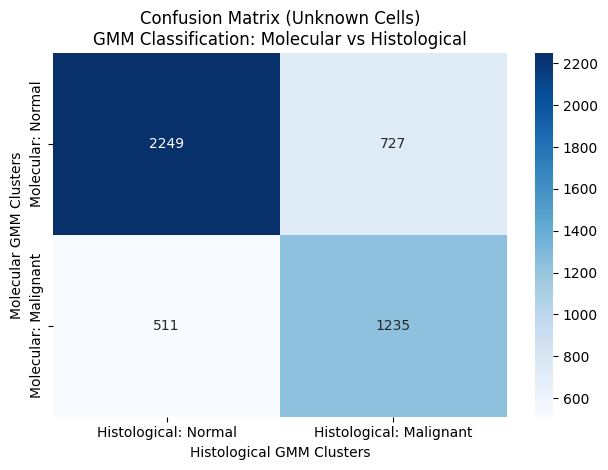

In [138]:
# Trova i nomi delle cellule 'Unknown' in entrambi i dataset
unknown_mol = molecular_single_features_downsampling.obs_names[
    molecular_single_features_downsampling.obs['cell_type_prediction'] == 'Unknown']

unknown_hist = histological_single_features_downsampling.obs_names[
    histological_single_features_downsampling.obs['cell_type_prediction'] == 'Unknown']

# Intersezione: solo le cellule Unknown presenti in entrambi
common_unknown = unknown_mol.intersection(unknown_hist)

mol_unknown = molecular_single_features_downsampling[common_unknown].copy()
hist_unknown = histological_single_features_downsampling[common_unknown].copy()

# Verifica allineamento perfetto
assert all(mol_unknown.obs_names == hist_unknown.obs_names)

cluster_label_map = {'0': 'Normal', '1': 'Malignant'}

gmm_mol = mol_unknown.obs["gmm_single_clusters_down"].map(cluster_label_map)
gmm_hist = hist_unknown.obs["gmm_single_clusters_downsampling"].map(cluster_label_map)

conf_mat = confusion_matrix(
    gmm_mol,
    gmm_hist,
    labels=['Normal', 'Malignant'])

sns.heatmap(
    conf_mat,
    annot=True,
    fmt='d',
    cmap='Blues',
    xticklabels=['Histological: Normal', 'Histological: Malignant'],
    yticklabels=['Molecular: Normal', 'Molecular: Malignant'])

plt.title('Confusion Matrix (Unknown Cells)\nGMM Classification: Molecular vs Histological')
plt.xlabel('Histological GMM Clusters')
plt.ylabel('Molecular GMM Clusters')
plt.tight_layout()
plt.show()

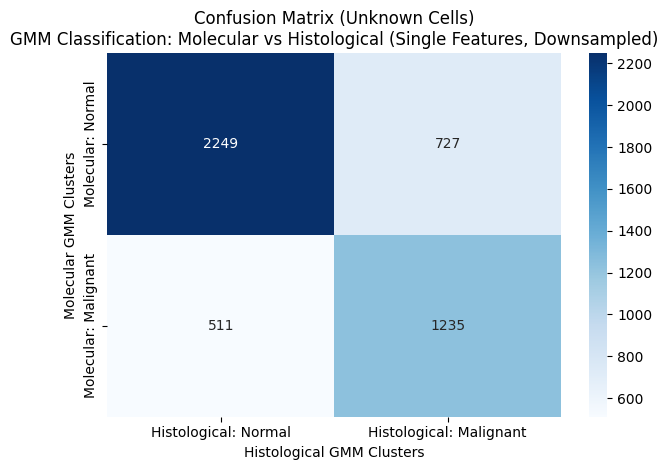

In [793]:
# Trova i nomi delle cellule 'Unknown' in entrambi i dataset
unknown_mol = molecular_single_features_downsampling.obs_names[
    molecular_single_features_downsampling.obs['cell_type_prediction'] == 'Unknown']

unknown_hist = histological_single_features_downsampling.obs_names[
    histological_single_features_downsampling.obs['cell_type_prediction'] == 'Unknown']

# Intersezione: solo le cellule Unknown presenti in entrambi
common_unknown = unknown_mol.intersection(unknown_hist)

mol_unknown = molecular_single_features_downsampling[common_unknown].copy()
hist_unknown = histological_single_features_downsampling[common_unknown].copy()

# Verifica allineamento perfetto
assert all(mol_unknown.obs_names == hist_unknown.obs_names)

cluster_label_map_mol = {'0': 'Normal', '1': 'Malignant'}

gmm_mol = mol_unknown.obs["gmm_single_clusters_down"].map(cluster_label_map)
gmm_hist = hist_unknown.obs["gmm_single_clusters_downsampling"].map(cluster_label_map)

conf_mat = confusion_matrix(
    gmm_mol,
    gmm_hist,
    labels=['Normal', 'Malignant'])

sns.heatmap(
    conf_mat,
    annot=True,
    fmt='d',
    cmap='Blues',
    xticklabels=['Histological: Normal', 'Histological: Malignant'],
    yticklabels=['Molecular: Normal', 'Molecular: Malignant'])

plt.title('Confusion Matrix (Unknown Cells)\nGMM Classification: Molecular vs Histological (Single Features, Downsampled)')
plt.xlabel('Histological GMM Clusters')
plt.ylabel('Molecular GMM Clusters')
plt.tight_layout()
plt.show()

In [596]:
xenium.tables["table"].obs.index = xenium.tables["table"].obs.index.astype(str)
varrone_df.index = varrone_df.index.astype(str)

xenium.tables["table"].obs = xenium.tables["table"].obs.join(
    varrone_df[["level1", "level2"]],
    how="left")

In [597]:
# Accesso al DataFrame obs di xenium (usando tables se la versione nuova)
xenium_table = xenium.table.obs  

# Prendi la colonna da epithelial_cells
cell_type_series = epithelial_cells.obs["cell_type_prediction"]

# Aggiungi la colonna in xenium, allineando tramite indice
# Questo aggiungerà NaN per le celle non presenti in epithelial_cells
xenium_table["cell_type_prediction"] = cell_type_series.reindex(xenium_table.index)

# Verifica
print(xenium_table["cell_type_prediction"].head())

0    NaN
1    NaN
2    NaN
3    NaN
4    NaN
Name: cell_type_prediction, dtype: category
Categories (3, object): ['Malignant', 'Normal', 'Unknown']


/tmp/ipykernel_1097759/2027364413.py:2: DeprecationWarning: Table accessor will be deprecated with SpatialData version 0.1, use sdata.tables instead.
  xenium_table = xenium.table.obs


In [780]:
# Usare la nuova sintassi (SpatialData 0.1+)
unknown_ids = xenium.tables["table"].obs.index[
    xenium.tables["table"].obs["cell_type_prediction"] == "Unknown"]

cell_geometries = xenium.shapes["cell_circles"].copy()
cell_geometries.index = cell_geometries.index.astype(str)

common_unknown_ids = unknown_ids.intersection(cell_geometries.index)

print(f"Celle comuni: {len(common_unknown_ids)}")

all_coords = np.stack([
    cell_geometries.geometry.centroid.x.values,
    cell_geometries.geometry.centroid.y.values], axis=1)

unknown_geoms = cell_geometries.loc[common_unknown_ids]
unknown_coords = np.stack([
    unknown_geoms.geometry.centroid.x.values,
    unknown_geoms.geometry.centroid.y.values
], axis=1)


# KDTree (short for k-dimensional tree) è una struttura dati ad albero usata per organizzare punti in uno spazio a più dimensioni 
# per trovare i vicini più prossimi


tree = KDTree(all_coords)
k = 6
dists, neighbor_indices = tree.query(unknown_coords, k=k)

all_cell_ids_str = cell_geometries.index.to_numpy()

unknown_to_neighbors = {}
for i, unk_id in enumerate(common_unknown_ids):
    neighbors = all_cell_ids_str[neighbor_indices[i]]
    neighbors = neighbors[neighbors != unk_id]
    unknown_to_neighbors[unk_id] = neighbors.tolist()

# 6. Ottieni tipi 'level1' dei vicini (usa stringhe coerenti)
for unk_id, neigh_ids in list(unknown_to_neighbors.items())[:5]:
    neigh_types = xenium.table.obs.loc[neigh_ids, "level1"]
    print(f"Unknown cell {unk_id} neighbors (level1 types): {neigh_types.tolist()}")

Celle comuni: 4882
Unknown cell 45 neighbors (level1 types): ['Connective_tissue', 'Epithelial', 'Epithelial', 'Epithelial', 'Epithelial']
Unknown cell 125 neighbors (level1 types): ['Epithelial', 'Epithelial', 'Epithelial', 'Immune', 'Immune']
Unknown cell 127 neighbors (level1 types): ['Immune', 'Immune', 'Immune', 'Immune', 'Immune']
Unknown cell 289 neighbors (level1 types): ['Epithelial', 'Epithelial', 'Epithelial', 'Vascular', 'Epithelial']
Unknown cell 1275 neighbors (level1 types): ['Epithelial', 'Epithelial', 'Epithelial', 'Epithelial', 'Epithelial']


/tmp/ipykernel_1097759/3851588153.py:41: DeprecationWarning: Table accessor will be deprecated with SpatialData version 0.1, use sdata.tables instead.
  neigh_types = xenium.table.obs.loc[neigh_ids, "level1"]
/tmp/ipykernel_1097759/3851588153.py:41: DeprecationWarning: Table accessor will be deprecated with SpatialData version 0.1, use sdata.tables instead.
  neigh_types = xenium.table.obs.loc[neigh_ids, "level1"]
/tmp/ipykernel_1097759/3851588153.py:41: DeprecationWarning: Table accessor will be deprecated with SpatialData version 0.1, use sdata.tables instead.
  neigh_types = xenium.table.obs.loc[neigh_ids, "level1"]
/tmp/ipykernel_1097759/3851588153.py:41: DeprecationWarning: Table accessor will be deprecated with SpatialData version 0.1, use sdata.tables instead.
  neigh_types = xenium.table.obs.loc[neigh_ids, "level1"]
/tmp/ipykernel_1097759/3851588153.py:41: DeprecationWarning: Table accessor will be deprecated with SpatialData version 0.1, use sdata.tables instead.
  neigh_types

In [781]:
rows = []
for unk_id, neigh_ids in unknown_to_neighbors.items():
    neigh_types = xenium.tables["table"].obs.loc[neigh_ids, "level1"].tolist()
    rows.append({
        "unknown_cell_id": unk_id,
        "neighbor_cell_ids": neigh_ids,
        "neighbor_cell_types": neigh_types
    })

neighbors_df = pd.DataFrame(rows)

# Vedi le prime righe con info chiare
print(neighbors_df.head())

  unknown_cell_id                 neighbor_cell_ids  \
0              45              [26, 24, 35, 27, 43]   
1             125     [129, 44452, 44461, 130, 122]   
2             127          [153, 112, 115, 154, 86]   
3             289        [292, 7694, 288, 293, 291]   
4            1275  [1271, 48539, 48545, 1276, 1256]   

                                 neighbor_cell_types  
0  [Connective_tissue, Epithelial, Epithelial, Ep...  
1  [Epithelial, Epithelial, Epithelial, Immune, I...  
2           [Immune, Immune, Immune, Immune, Immune]  
3  [Epithelial, Epithelial, Epithelial, Vascular,...  
4  [Epithelial, Epithelial, Epithelial, Epithelia...  


In [786]:
neighbors_df["neighbor_type_counts"] = neighbors_df["neighbor_cell_types"].apply(lambda x: dict(Counter(x)))

print(neighbors_df[["unknown_cell_id", "neighbor_type_counts"]])


     unknown_cell_id                               neighbor_type_counts
0                 45          {'Connective_tissue': 1, 'Epithelial': 4}
1                125                     {'Epithelial': 3, 'Immune': 2}
2                127                                      {'Immune': 5}
3                289                   {'Epithelial': 4, 'Vascular': 1}
4               1275                                  {'Epithelial': 5}
...              ...                                                ...
4877          574158                                  {'Epithelial': 5}
4878          574207          {'Epithelial': 4, 'Connective_tissue': 1}
4879          574401                   {'Epithelial': 4, 'Vascular': 1}
4880          574406                                  {'Epithelial': 5}
4881          574827  {'Connective_tissue': 1, 'Immune': 3, 'Epithel...

[4882 rows x 2 columns]


In [784]:
def is_contaminated(type_counts):
    # Se c'è almeno un tipo diverso da 'Epithelial', ritorna True
    for cell_type in type_counts.keys():
        if cell_type != "Epithelial":
            return True
    return False

neighbors_df["contaminated"] = neighbors_df["neighbor_type_counts"].apply(is_contaminated)

# Quante sono contaminate?
num_contaminated = neighbors_df["contaminated"].sum()
print(f"Cellule Unknown contaminate da tipi non epiteliali: {num_contaminated} su {len(neighbors_df)}")

# Vedi le prime 10 cellule contaminate
print(neighbors_df[neighbors_df["contaminated"]].head(10))

Cellule Unknown contaminate da tipi non epiteliali: 2835 su 4882
   unknown_cell_id                   neighbor_cell_ids  \
0               45                [26, 24, 35, 27, 43]   
1              125       [129, 44452, 44461, 130, 122]   
2              127            [153, 112, 115, 154, 86]   
3              289          [292, 7694, 288, 293, 291]   
5             1749      [1685, 1751, 1748, 1745, 9042]   
7             2029     [2031, 2027, 2028, 2026, 56725]   
8             2289     [2288, 58244, 2286, 2290, 2293]   
9             2327  [2317, 548256, 2322, 548255, 2336]   
10            2571    [2569, 61816, 61823, 2574, 2572]   
11            2618    [2620, 2617, 63754, 63760, 2621]   

                                  neighbor_cell_types  \
0   [Connective_tissue, Epithelial, Epithelial, Ep...   
1   [Epithelial, Epithelial, Epithelial, Immune, I...   
2            [Immune, Immune, Immune, Immune, Immune]   
3   [Epithelial, Epithelial, Epithelial, Vascular,...   
5   [Connec

In [790]:
# Funzione per verificare se tra i vicini c'è almeno un tipo non epiteliale
def is_contaminated(neigh_ids):
    neigh_types = xenium.tables["table"].obs.loc[neigh_ids, "level1"]
    return any(t != "Epithelial" for t in neigh_types)

# Applica la funzione a tutte le unknown
contaminated_flags = {
    unk_id: is_contaminated(neigh_ids)
    for unk_id, neigh_ids in unknown_to_neighbors.items()
}

# Conta quante Unknown sono contaminate
num_contaminated = sum(contaminated_flags.values())
total_unknowns = len(contaminated_flags)
percent = (num_contaminated / total_unknowns) * 100

print(f"Cellule Unknown contaminate da tipi non epiteliali (k=6): {num_contaminated} su {total_unknowns} ({percent:.2f}%)")


Cellule Unknown contaminate da tipi non epiteliali (k=6): 2835 su 4882 (58.07%)


In [791]:
# Funzione per verificare se tra i 5 vicini nessuno di essi è epiteliale
def is_fully_contaminated(neigh_ids):
    neigh_types = xenium.tables["table"].obs.loc[neigh_ids, "level1"]
    return all(t != "Epithelial" for t in neigh_types)

# Applica la funzione a tutte le unknown
fully_contaminated_flags = {
    unk_id: is_fully_contaminated(neigh_ids)
    for unk_id, neigh_ids in unknown_to_neighbors.items()
}

# Conta quante Unknown sono contaminate secondo il nuovo criterio
num_fully_contaminated = sum(fully_contaminated_flags.values())
total_unknown = len(fully_contaminated_flags)

print(f"Cellule Unknown contaminate da soli tipi non epiteliali (k=6): {num_fully_contaminated} su {total_unknown} ({(num_fully_contaminated / total_unknown * 100):.2f}%)")


Cellule Unknown contaminate da soli tipi non epiteliali (k=6): 232 su 4882 (4.75%)


In [792]:
# Estrai tutte le liste di tipi vicini delle Unknown contaminate
all_neighbor_types = neighbors_df["neighbor_cell_types"].explode()

# Conta quante volte ogni tipo compare
type_counts = all_neighbor_types.value_counts()

# Calcola la proporzione su tutte le occorrenze
type_proportions = type_counts / type_counts.sum()

print("Count of cell types neighboring the Unknown cells:")
print(type_counts)

print("\nProportion of cell types neighboring the Unknown cells:")
print(type_proportions)

Count of cell types neighboring the Unknown cells:
neighbor_cell_types
Epithelial           18006
Immune                2811
Connective_tissue     2543
Vascular              1050
Name: count, dtype: int64

Proportion of cell types neighboring the Unknown cells:
neighbor_cell_types
Epithelial           0.737649
Immune               0.115158
Connective_tissue    0.104179
Vascular             0.043015
Name: count, dtype: float64


In [603]:
# Aggiungo anche le cellule Normal per confrontarle con le Unkown
# Trova ID delle cellule Normal
normal_ids = xenium.tables["table"].obs.index[
    xenium.tables["table"].obs["cell_type_prediction"] == "Normal"]

common_normal_ids = normal_ids.intersection(cell_geometries.index)

normal_geoms = cell_geometries.loc[common_normal_ids]
normal_coords = np.stack([
    normal_geoms.geometry.centroid.x.values,
    normal_geoms.geometry.centroid.y.values], axis=1)

# 4. Trova i vicini più vicini usando KDTree
k = 2
dists_normal, neighbor_indices_normal = tree.query(normal_coords, k=k)

# 5. Associa ogni cellula Normal ai suoi vicini
normal_to_neighbors = {}
for i, norm_id in enumerate(common_normal_ids):
    neighbors = all_cell_ids_str[neighbor_indices_normal[i]]
    neighbors = neighbors[neighbors != norm_id]
    normal_to_neighbors[norm_id] = neighbors.tolist()

rows_normal = []
for norm_id, neigh_ids in normal_to_neighbors.items():
    neigh_types = xenium.tables["table"].obs.loc[neigh_ids, "level1"].tolist()
    rows_normal.append({
        "normal_cell_id": norm_id,
        "neighbor_cell_ids": neigh_ids,
        "neighbor_cell_types": neigh_types
    })

normal_neighbors_df = pd.DataFrame(rows_normal)

normal_neighbors_df["neighbor_type_counts"] = normal_neighbors_df["neighbor_cell_types"].apply(lambda x: dict(Counter(x)))

def is_contaminated(type_counts):
    for cell_type in type_counts.keys():
        if cell_type != "Epithelial":
            return True
    return False

normal_neighbors_df["contaminated"] = normal_neighbors_df["neighbor_type_counts"].apply(is_contaminated)

print(f"Normal contaminate: {normal_neighbors_df['contaminated'].sum()} su {len(normal_neighbors_df)}")

Normal contaminate: 4844 su 25463


In [604]:
print(normal_neighbors_df[normal_neighbors_df["contaminated"]].head(10))

   normal_cell_id neighbor_cell_ids  neighbor_cell_types  \
0             530             [539]           [Vascular]   
2            2061            [2053]  [Connective_tissue]   
3            2696           [61736]  [Connective_tissue]   
4            2699            [2701]  [Connective_tissue]   
9            3995           [43096]  [Connective_tissue]   
14           4050            [4052]             [Immune]   
21           4178            [4102]             [Immune]   
22           4192          [561300]           [Vascular]   
31           4557            [4555]             [Immune]   
34           4829            [5080]           [Vascular]   

        neighbor_type_counts  contaminated  
0            {'Vascular': 1}          True  
2   {'Connective_tissue': 1}          True  
3   {'Connective_tissue': 1}          True  
4   {'Connective_tissue': 1}          True  
9   {'Connective_tissue': 1}          True  
14             {'Immune': 1}          True  
21             {'Immune'

In [605]:
# Crea una colonna nel GeoDataFrame con valori default
cell_geometries["contamination_status"] = "Other"

# Unknown contaminate
cell_geometries.loc[neighbors_df[neighbors_df["contaminated"]]["unknown_cell_id"], "contamination_status"] = "Unknown_contaminated"

# Unknown non contaminate
cell_geometries.loc[neighbors_df[~neighbors_df["contaminated"]]["unknown_cell_id"], "contamination_status"] = "Unknown_clean"

# Normal contaminate
cell_geometries.loc[normal_neighbors_df[normal_neighbors_df["contaminated"]]["normal_cell_id"], "contamination_status"] = "Normal_contaminated"

# Normal non contaminate
cell_geometries.loc[normal_neighbors_df[~normal_neighbors_df["contaminated"]]["normal_cell_id"], "contamination_status"] = "Normal_clean"


In [606]:
# Vicini delle contaminate
contaminated_neighbors = neighbors_df[neighbors_df["contaminated"]]["neighbor_cell_types"].explode()
cont_counts = contaminated_neighbors.value_counts()
cont_props = cont_counts / cont_counts.sum()

# Vicini delle non contaminate
clean_neighbors = neighbors_df[~neighbors_df["contaminated"]]["neighbor_cell_types"].explode()
clean_counts = clean_neighbors.value_counts()
clean_props = clean_counts / clean_counts.sum()

print("Proportion of cell types neighboring \n the contaminated Unknown cells:")
print(cont_props)

print("\nProportion of cell types neighboring \n the non-contaminated Unknown cells:")
print(clean_props)

Proportion of cell types neighboring 
 the contaminated Unknown cells:
neighbor_cell_types
Immune               0.443902
Connective_tissue    0.391870
Vascular             0.164228
Name: count, dtype: float64

Proportion of cell types neighboring 
 the non-contaminated Unknown cells:
neighbor_cell_types
Epithelial    1.0
Name: count, dtype: float64


In [607]:
# Vicini delle Normal contaminate
cont_neighbors_normal = normal_neighbors_df[normal_neighbors_df["contaminated"]]["neighbor_cell_types"].explode()
cont_counts_normal = cont_neighbors_normal.value_counts()
cont_props_normal = cont_counts_normal / cont_counts_normal.sum()

# Vicini delle Normal non contaminate
clean_neighbors_normal = normal_neighbors_df[~normal_neighbors_df["contaminated"]]["neighbor_cell_types"].explode()
clean_counts_normal = clean_neighbors_normal.value_counts()
clean_props_normal = clean_counts_normal / clean_counts_normal.sum()

print("Proportion of cell types neighboring \n the contaminated Normal cells:")
print(cont_props_normal)

print("\nProportion of cell types neighboring \n the non-contaminated Normal cells:")
print(clean_props_normal)

Proportion of cell types neighboring 
 the contaminated Normal cells:
neighbor_cell_types
Connective_tissue    0.431668
Immune               0.344137
Vascular             0.224195
Name: count, dtype: float64

Proportion of cell types neighboring 
 the non-contaminated Normal cells:
neighbor_cell_types
Epithelial    1.0
Name: count, dtype: float64


In [608]:
# Prendi i conteggi assoluti per tipi vicini (contaminate)
cont_counts_unknown = neighbors_df[neighbors_df["contaminated"]]["neighbor_cell_types"].explode().value_counts()
cont_counts_normal = normal_neighbors_df[normal_neighbors_df["contaminated"]]["neighbor_cell_types"].explode().value_counts()

# Unisci i conteggi in un DataFrame (riempi con zero se un tipo manca in uno dei due)
contingency_df = pd.DataFrame({
    "Unknown_contaminated": cont_counts_unknown,
    "Normal_contaminated": cont_counts_normal
}).fillna(0).astype(int)

print(contingency_df)

                     Unknown_contaminated  Normal_contaminated
neighbor_cell_types                                           
Connective_tissue                     482                 2091
Immune                                546                 1667
Vascular                              202                 1086


In [609]:
chi2, p, dof, expected = chi2_contingency(contingency_df)

print(f"Chi-square test statistic: {chi2:.3f}")
print(f"P-value: {p:.4e}")

if p < 0.05:
    print("The distributions of neighboring cell types differ significantly between contaminated Unknown and Normal cells.")
else:
    print("There are no significant differences in the distributions of neighboring cell types between contaminated Unknown and Normal cells.")

Chi-square test statistic: 47.100
P-value: 5.9214e-11
The distributions of neighboring cell types differ significantly between contaminated Unknown and Normal cells.


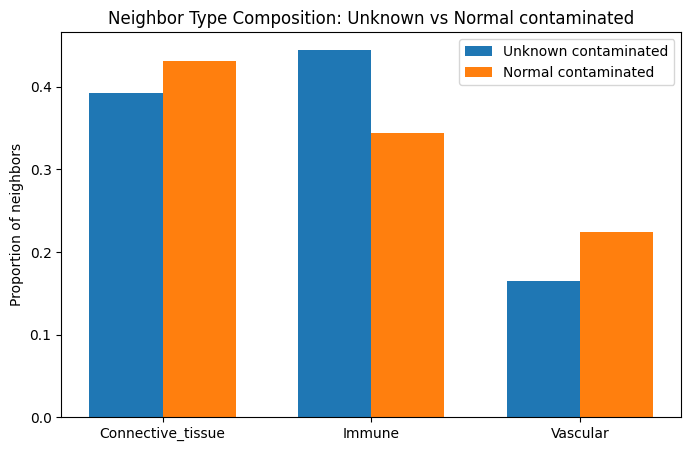

In [610]:
contingency_df_norm = contingency_df.div(contingency_df.sum(axis=0), axis=1)  # proporzioni

types = contingency_df_norm.index.tolist()
x = np.arange(len(types))

width = 0.35

fig, ax = plt.subplots(figsize=(8, 5))
bar1 = ax.bar(x - width/2, contingency_df_norm["Unknown_contaminated"], width, label='Unknown contaminated')
bar2 = ax.bar(x + width/2, contingency_df_norm["Normal_contaminated"], width, label='Normal contaminated')

ax.set_xticks(x)
ax.set_xticklabels(types)
ax.set_ylabel("Proportion of neighbors")
ax.set_title("Neighbor Type Composition: Unknown vs Normal contaminated")
ax.legend()

plt.show()

/tmp/ipykernel_1097759/572683542.py:26: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


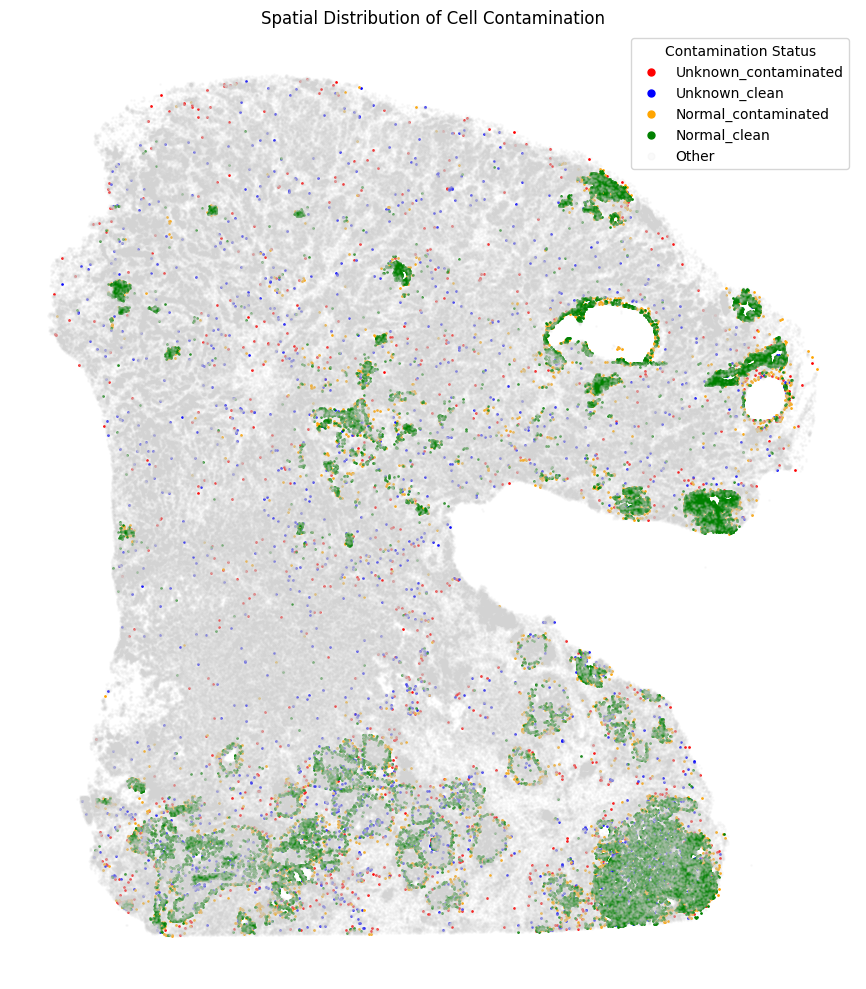

In [611]:
# Fase 1: Visualizzazione spaziale
# Obiettivo: le cellule contaminate sono in zone particolari, come bordi tra cluster o vicini ad altri tipi cellulari?
fig, ax = plt.subplots(figsize=(10, 10))

colors = {
    "Unknown_contaminated": "red",
    "Unknown_clean": "blue",
    "Normal_contaminated": "orange",
    "Normal_clean": "green",
    "Other": "lightgrey"}

for status, color in colors.items():
    subset = cell_geometries[cell_geometries["contamination_status"] == status]
    if status == "Other":
        subset.plot(ax=ax, color=color, markersize=1, label=status, alpha=0.1)  # trasparenza
    else:
        subset.plot(ax=ax, color=color, markersize=1, label=status)

plt.legend(markerscale=5, title="Contamination Status")
plt.title("Spatial Distribution of Cell Contamination")
plt.axis("off")

# Inverti l'asse Y
ax.set_ylim(ax.get_ylim()[::-1])

plt.tight_layout()
plt.show()

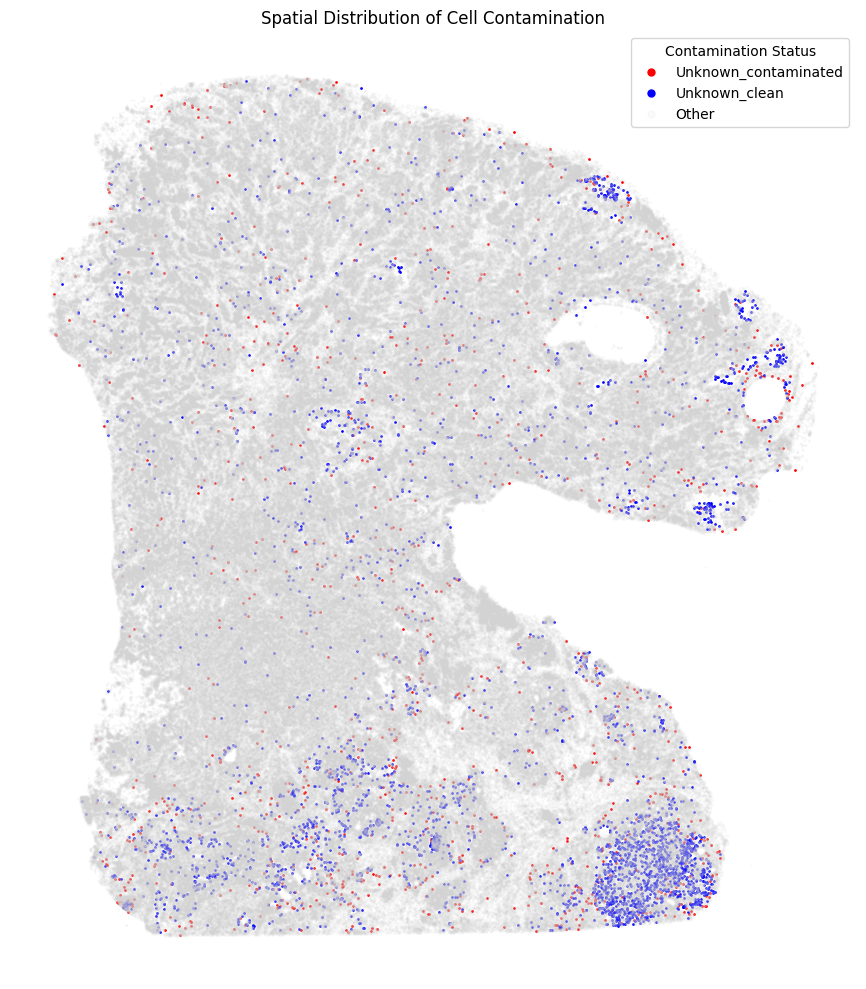

In [732]:
# Fase 1: Visualizzazione spaziale
# Obiettivo: le cellule contaminate sono in zone particolari, come bordi tra cluster o vicini ad altri tipi cellulari?
fig, ax = plt.subplots(figsize=(10, 10))

colors = {
    "Unknown_contaminated": "red",
    "Unknown_clean": "blue",
    "Other": "lightgrey"}

for status, color in colors.items():
    subset = cell_geometries[cell_geometries["contamination_status"] == status]
    if status == "Other":
        subset.plot(ax=ax, color=color, markersize=1, label=status, alpha=0.1)  # trasparenza
    else:
        subset.plot(ax=ax, color=color, markersize=1, label=status)

plt.legend(markerscale=5, title="Contamination Status")
plt.title("Spatial Distribution of Cell Contamination")
plt.axis("off")

# Inverti l'asse Y
ax.set_ylim(ax.get_ylim()[::-1])

plt.tight_layout()
plt.show()

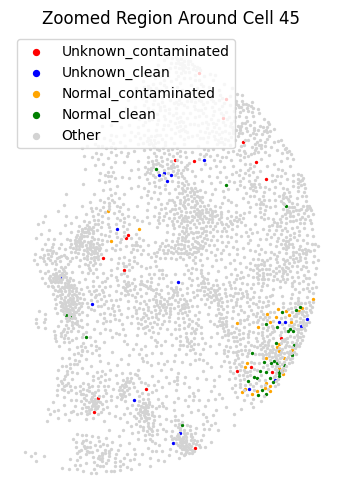

In [419]:
# Scegli una regione (es. intorno alla cella 127)
cell_id = "45"
buffer_radius = 500  # in micron o unità del dataset

target_geom = cell_geometries.loc[cell_id].geometry
buffer = target_geom.buffer(buffer_radius)

zoomed = cell_geometries[cell_geometries.intersects(buffer)]

fig, ax = plt.subplots(figsize=(6, 6))
for status, color in colors.items():
    subset = zoomed[zoomed["contamination_status"] == status]
    subset.plot(ax=ax, color=color, markersize=2, label=status)

plt.legend(markerscale=3)
plt.title(f"Zoomed Region Around Cell {cell_id}")
plt.axis("off")
plt.show()

In [612]:
# Fase 2: DGE tra Unknown contaminate e Unknown non contaminate

adata = xenium.tables["table"]

# Ricava gli ID delle unknown contaminate e pulite
ids_contaminated = neighbors_df[neighbors_df["contaminated"]]["unknown_cell_id"]
ids_clean = neighbors_df[~neighbors_df["contaminated"]]["unknown_cell_id"]

# Crea due AnnData distinti
adata_contaminated = adata[adata.obs.index.isin(ids_contaminated)].copy()
adata_clean = adata[adata.obs.index.isin(ids_clean)].copy()

In [613]:
# Converte in set
contaminated_set = set(ids_contaminated)
clean_set = set(ids_clean)

# Unione degli ID
all_ids = contaminated_set.union(clean_set)

# Sottoinsieme di adata
adata_unknown = adata[adata.obs.index.isin(all_ids)].copy()

# Etichetta i gruppi
adata_unknown.obs["contamination_group"] = "clean"
adata_unknown.obs.loc[adata_unknown.obs.index.isin(contaminated_set), "contamination_group"] = "contaminated"

In [614]:
# Considero solo i geni espressi in almeno 10 cellule
sc.pp.filter_genes(adata_unknown, min_cells=20)

# Normalizza e log trasforma
sc.pp.normalize_total(adata_unknown, target_sum=1e4)
sc.pp.log1p(adata_unknown)

# Salvo la versione normalizzata e log-transformata in .raw (per accesso futuro)
adata_unknown.raw = adata_unknown.copy()

# Calcola vicini e UMAP (necessari per selezione regioni e visualizzazioni)
sc.pp.neighbors(adata_unknown)
sc.tl.umap(adata_unknown)

/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:235: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))
/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/scanpy/tools/_utils.py:40: UserWarning: You’re trying to run this on 264 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(
/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/scipy/sparse/_index.py:210: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_arrayXarray(i, j, x)


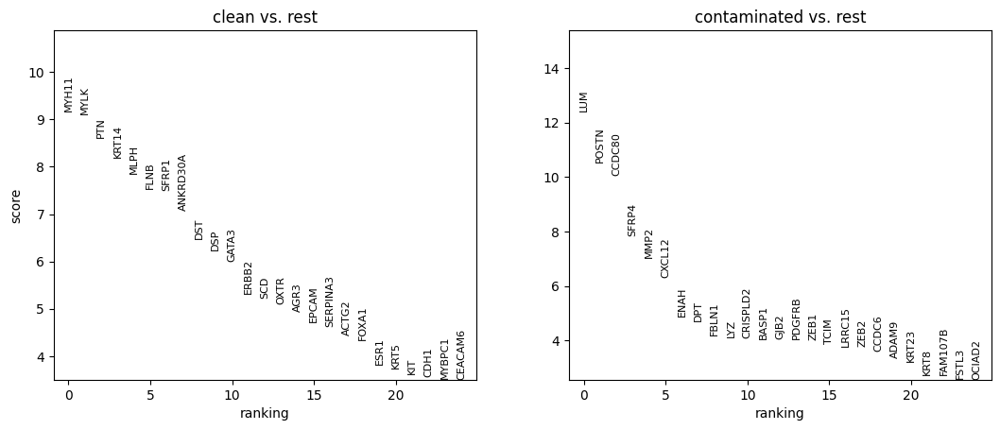

In [615]:
sc.tl.rank_genes_groups(
    adata_unknown,
    groupby="contamination_group",
    method="wilcoxon",
    use_raw=False)

# Visualizza i primi geni significativi
sc.pl.rank_genes_groups(adata_unknown, n_genes=25, sharey=False)

In [616]:
# Esporta in un DataFrame
deg_df = sc.get.rank_genes_groups_df(adata_unknown, group='contaminated')

# Visualizza i primi 10 geni
print(deg_df.head(10))

    names     scores  logfoldchanges         pvals     pvals_adj
0     LUM  12.422052        2.350734  1.984054e-35  5.237902e-33
1   POSTN  10.539524        1.789630  5.678569e-26  7.495711e-24
2  CCDC80  10.046311        2.086326  9.537038e-24  8.392594e-22
3   SFRP4   7.834417        2.252024  4.710214e-15  1.381663e-13
4    MMP2   7.030926        1.715323  2.051675e-12  4.166479e-11
5  CXCL12   6.309112        1.128721  2.806411e-10  4.939283e-09
6    ENAH   4.882395        0.462283  1.048050e-06  1.257660e-05
7     DPT   4.720010        2.296566  2.358327e-06  2.594159e-05
8   FBLN1   4.173036        1.473360  3.005670e-05  2.833917e-04
9     LYZ   4.125730        0.977216  3.695604e-05  3.364274e-04


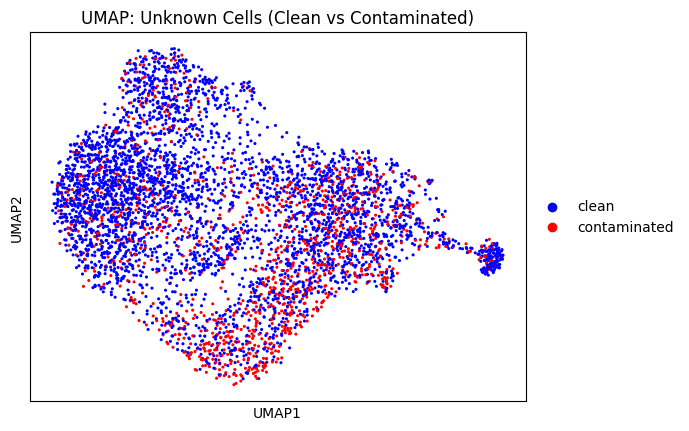

In [624]:
sc.pl.umap(
    adata_unknown,
    color="contamination_group",
    palette={"clean": "blue", "contaminated": "red"},
    title="UMAP: Unknown Cells (Clean vs Contaminated)",
    size=20)

In [627]:
print(f"X range: {x.min():.2f} - {x.max():.2f}")
print(f"Y range: {y.min():.2f} - {y.max():.2f}")

X range: -5.46 - 9.94
Y range: 1.40 - 10.49


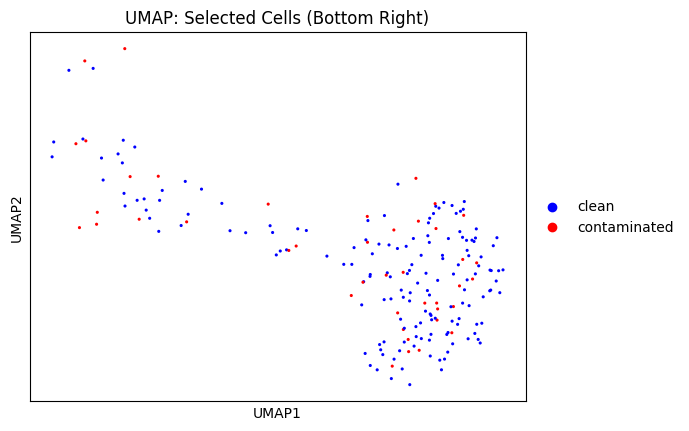

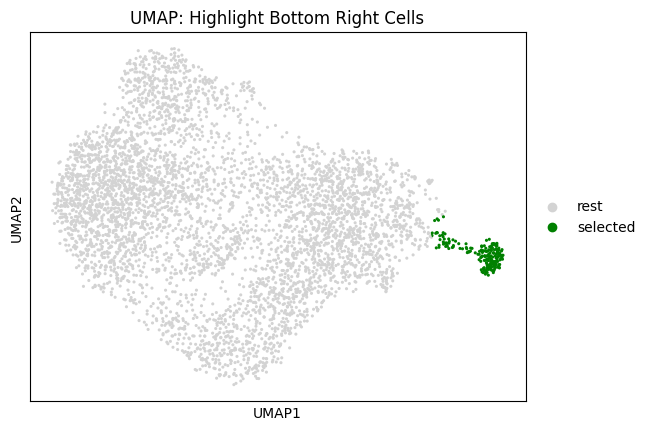

Selected cells: 201


In [770]:
# Estrai le coordinate UMAP
umap_coords = adata_unknown.obsm["X_umap"]
x = umap_coords[:, 0]
y = umap_coords[:, 1]

# Nuova selezione: parte in basso a destra
mask_bottom_right = (x > 7.5) & (y < 6)

# Assegna le etichette
adata_unknown.obs["selected_region"] = "rest"
adata_unknown.obs.loc[mask_bottom_right, "selected_region"] = "selected"

# Estrai le cellule selezionate
selected_cells = adata_unknown[mask_bottom_right].copy()

# Plotta le celle selezionate
sc.pl.umap(
    selected_cells,
    color="contamination_group",
    palette={"clean": "blue", "contaminated": "red"},
    title="UMAP: Selected Cells (Bottom Right)",
    size=20)

# Plotta tutta la UMAP evidenziando la regione
sc.pl.umap(
    adata_unknown,
    color="selected_region",
    palette={"selected": "green", "rest": "lightgray"},
    title="UMAP: Highlight Bottom Right Cells",
    size=20)

print(f"Selected cells: {mask_bottom_right.sum()}")

In [771]:
# Estrai coordinate UMAP
umap_coords = adata_unknown.obsm["X_umap"]
x = umap_coords[:, 0]
y = umap_coords[:, 1]

# Calcola il centro dell'UMAP (media di tutte le coordinate)
x_center = np.median(x)  # oppure np.mean(x)
y_center = np.median(y)

# Calcola la distanza euclidea dal centro
distance_from_center = np.sqrt((x - x_center)**2 + (y - y_center)**2)

# Applica solo alle cellule 'rest'
rest_mask = adata_unknown.obs["selected_region"] == "rest"
rest_indices = np.where(rest_mask)[0]

# Ordina le rest per distanza dal centro
central_rest_indices = rest_indices[np.argsort(distance_from_center[rest_indices])]

# Seleziona le N più centrali (es. 152)
n_cells = adata_unknown.obs["selected_region"].value_counts()["selected"]
central_rest_indices = central_rest_indices[:n_cells]

# Crea la maschera
mask_central_rest = np.zeros(adata_unknown.shape[0], dtype=bool)
mask_central_rest[central_rest_indices] = True

# Aggiorna selected_region
adata_unknown.obs["selected_region"] = "rest"
adata_unknown.obs.loc[mask_bottom_right, "selected_region"] = "selected"  # le selezionate prima
adata_unknown.obs.loc[mask_central_rest, "selected_region"] = "rest_center"

In [772]:
# Subset
adata_selected = adata_unknown[adata_unknown.obs["selected_region"] == "selected"]
adata_rest_center = adata_unknown[adata_unknown.obs["selected_region"] == "rest_center"]

# Concatena
adata_comp = adata_selected.concatenate(adata_rest_center, batch_key="selected_region", batch_categories=["selected", "rest_center"])


/tmp/ipykernel_1097759/108584123.py:6: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_comp = adata_selected.concatenate(adata_rest_center, batch_key="selected_region", batch_categories=["selected", "rest_center"])


In [773]:
sc.pp.normalize_total(adata_comp, target_sum=1e4)
sc.pp.log1p(adata_comp)
adata_comp.raw = adata_comp.copy()

/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:235: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


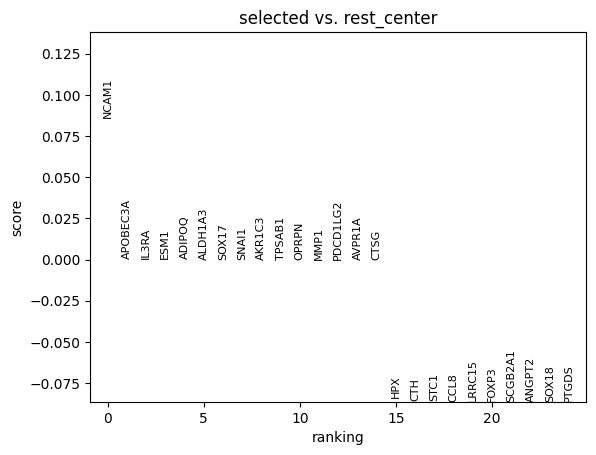

In [774]:
sc.tl.rank_genes_groups(
    adata_comp,
    groupby="selected_region",
    groups=["selected"],
    reference="rest_center",
    method="wilcoxon",
    use_raw=True  # ora è disponibile e corretto
        )

# Visualizzo i primi geni significativi
sc.pl.rank_genes_groups(
    adata_comp,
    n_genes=25,
    sharey=False,
    title="DGE: Selected vs Rest")

In [775]:
# Estraggo i risultati della DGE
result = adata_comp.uns["rank_genes_groups"]
group = "selected"

dge_table = pd.DataFrame({
    "gene": result["names"][group],
    "logfoldchange": result["logfoldchanges"][group],
    "pval": result["pvals"][group],
    "pval_adj": result["pvals_adj"][group],
    "score": result["scores"][group],})

print(dge_table.head(10))

       gene  logfoldchange      pval  pval_adj     score
0     NCAM1      25.482752  0.931244  0.985556  0.086280
1  APOBEC3A       0.618341  0.999658  1.000000  0.000429
2     IL3RA       0.695142  0.999658  1.000000  0.000429
3      ESM1       0.674352  0.999658  1.000000  0.000429
4    ADIPOQ       0.498093  0.999658  1.000000  0.000429
5   ALDH1A3       0.000000  1.000000  1.000000  0.000000
6     SOX17       0.000000  1.000000  1.000000  0.000000
7     SNAI1       0.000000  1.000000  1.000000  0.000000
8    AKR1C3       0.000000  1.000000  1.000000  0.000000
9    TPSAB1       0.000000  1.000000  1.000000  0.000000


In [776]:
def get_expressed_genes(adata_subset, min_cells=3):
    X = adata_subset.X
    if hasattr(X, "toarray"):
        X = X.toarray()
    # Conta in quanti punti (cellule) ogni gene è espresso
    expressed = (X > 0).sum(axis=0)
    gene_names = adata_subset.var_names
    expressed_genes = gene_names[expressed >= min_cells]
    return set(expressed_genes)

# Geni espressi nei due gruppi
genes_selected = get_expressed_genes(adata_selected)
genes_rest = get_expressed_genes(adata_rest_center)

print(f"Geni espressi nel gruppo selected: {len(genes_selected)}")
print(f"Geni espressi nel gruppo rest_center: {len(genes_rest)}")

# Intersezione: geni espressi in almeno uno dei due gruppi
shared_genes = genes_selected.union(genes_rest)
print(f"Geni espressi in almeno uno dei due gruppi: {len(shared_genes)}")


Geni espressi nel gruppo selected: 1
Geni espressi nel gruppo rest_center: 224
Geni espressi in almeno uno dei due gruppi: 224


In [778]:
adata_unknown.obs["selected_region"].unique()


['selected', 'rest', 'rest_center']
Categories (3, object): ['rest', 'rest_center', 'selected']

/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:934: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(


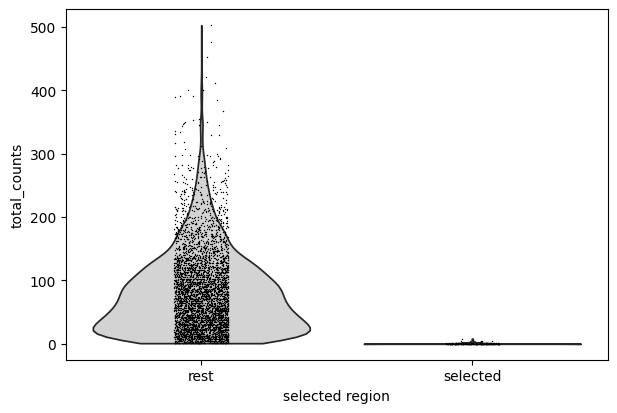

In [779]:
adata_filtered = adata_unknown[adata_unknown.obs["selected_region"] != "rest_center"]

sc.pl.violin(
    adata_filtered,
    ['total_counts'],
    groupby='selected_region',
    stripplot=True,
    palette={"selected": "green", "rest": "lightgray"}
)


In [731]:
selected_mask = adata_unknown.obs["selected_region"] == "selected"

# Prendi i valori espressi per tutte le variabili (genei) nelle cellule selected
X_selected = adata_unknown[selected_mask].X
if hasattr(X_selected, "toarray"):
    X_selected = X_selected.toarray()

# Conta quante espressioni non zero ci sono in ogni gene nelle selected cells
expressed_per_gene = (X_selected > 0).sum(axis=0)

# Quanti geni hanno almeno 1 cellula con espressione > 0?
print("Geni con espressione > 0 in almeno una cellula (selected):", (expressed_per_gene > 0).sum())

# Quanti geni hanno almeno 5 cellule con espressione > 0?
print("Geni con espressione > 0 in almeno 5 cellule (selected):", (expressed_per_gene >= 5).sum())


Geni con espressione > 0 in almeno una cellula (selected): 58
Geni con espressione > 0 in almeno 5 cellule (selected): 0


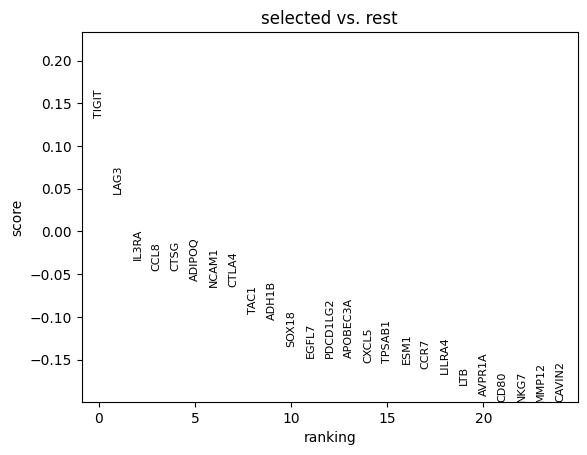

In [672]:
#  DGE: confronto tra 'selected' e 'rest' (celle distaccate vs resto)
sc.tl.rank_genes_groups(
    adata_unknown,
    groupby="selected_region",
    groups=["selected"],  # confronto selected vs rest
    reference="rest",
    method="wilcoxon",
    use_raw=False)

# Visualizzo i primi geni significativi
sc.pl.rank_genes_groups(
    adata_unknown,
    n_genes=25,
    sharey=False,
    title="DGE: Selected vs Rest")

In [673]:
# Estraggo i risultati della DGE
result = adata_unknown.uns["rank_genes_groups"]
group = "selected"

dge_table = pd.DataFrame({
    "gene": result["names"][group],
    "logfoldchange": result["logfoldchanges"][group],
    "pval": result["pvals"][group],
    "pval_adj": result["pvals_adj"][group],
    "score": result["scores"][group],})

print(dge_table.head(10))

     gene  logfoldchange      pval  pval_adj     score
0   TIGIT       1.425974  0.893777  0.925322  0.133526
1    LAG3       0.721059  0.964804  0.968473  0.044126
2   IL3RA       0.659123  0.973978  0.973978 -0.032619
3    CCL8      -0.333875  0.963556  0.968473 -0.045692
4    CTSG      -0.304372  0.963522  0.968473 -0.045734
5  ADIPOQ       0.103863  0.953472  0.968141 -0.058347
6   NCAM1       0.133355  0.948366  0.966675 -0.064758
7   CTLA4       0.050043  0.948366  0.966675 -0.064758
8    TAC1       0.061305  0.923604  0.948761 -0.095895
9   ADH1B      -0.149090  0.917934  0.946619 -0.103037


In [670]:
filtered_dge = dge_table[(dge_table["logfoldchange"] > 0.5) & (dge_table["pval"] < 0.05)]
print(filtered_dge.head(10))


Empty DataFrame
Columns: [gene, logfoldchange, pval, pval_adj, score]
Index: []


In [440]:
# Inizializza tutto a "rest"
adata_unknown.obs["dge_group"] = "rest"

# Metti "selected" solo per le celle nella regione selezionata
adata_unknown.obs.loc[mask_bottom_left, "dge_group"] = "selected"

adata_dge = adata_unknown[adata_unknown.obs["dge_group"].isin(["rest", "selected"])].copy()


In [455]:

# Estrai il dizionario dei risultati
result = adata_unknown.uns["rank_genes_groups"]

# Converti in DataFrame
selected_genes_df = pd.DataFrame({
    "gene": result["names"]["contaminated"],
    "pval": result["pvals"]["contaminated"],
    "logfoldchange": result["logfoldchanges"]["contaminated"]
})

# Mostra i primi 20 geni
selected_genes_df.head(20)


,gene,pval,logfoldchange
0,LUM,1.993067e-35,2.350450
1,POSTN,5.717538e-26,1.789372
2,CCDC80,9.556291e-24,2.086209
3,SFRP4,4.710652e-15,2.251971
4,MMP2,2.058048e-12,1.715205
5,CXCL12,2.836893e-10,1.128465
6,ENAH,1.062949e-06,0.461943
7,DPT,2.358869e-06,2.296184
8,FBLN1,3.006442e-05,1.473331
9,LYZ,3.697670e-05,0.977174


dge_group
rest        4729
selected     153
Name: count, dtype: int64


/mnt/ndata/virginia/conda/cellcharter_env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(


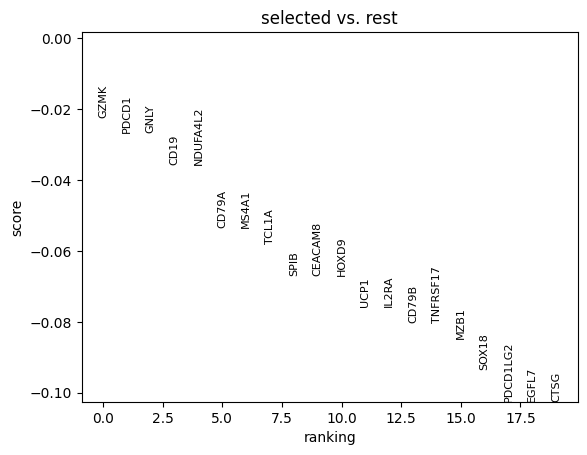

In [369]:
# PULIZIA: cancella i vecchi risultati DGE se ci sono
if "rank_genes_groups" in adata_unknown.uns:
    del adata_unknown.uns["rank_genes_groups"]

# (Ri)assegna i gruppi per la DGE
adata_unknown.obs["dge_group"] = "rest"
adata_unknown.obs.loc[mask_bottom_right, "dge_group"] = "selected"

# Verifica che i gruppi siano corretti
print(adata_unknown.obs["dge_group"].value_counts())

# CREA UN NUOVO AnnData solo con selected e rest
adata_dge = adata_unknown[adata_unknown.obs["dge_group"].isin(["rest", "selected"])].copy()

# (Solo se non hai già normalizzato questi dati!)
# sc.pp.normalize_total(adata_dge, target_sum=1e4)
# sc.pp.log1p(adata_dge)

# Analisi DGE
sc.tl.rank_genes_groups(
    adata_dge,
    groupby="dge_group",
    reference="rest",
    groups=["selected"],
    method="wilcoxon",
    use_raw=False
)

# Visualizza i primi 20 geni
sc.pl.rank_genes_groups(
    adata_dge,
    n_genes=20,
    sharey=False
)


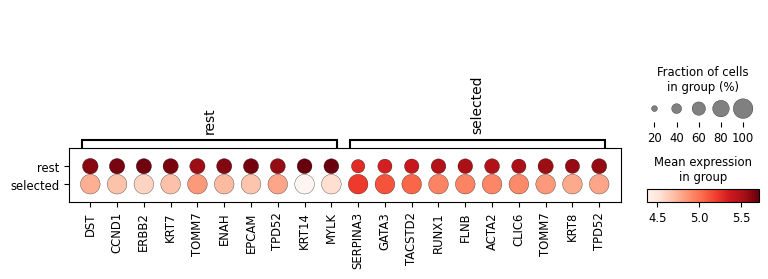

In [270]:
# questo dava risultati sensati ma non so cosa è successoo e ora non rieso più a ottenerli






sc.pl.rank_genes_groups_dotplot(
    adata_unknown,
    n_genes=10,
    cmap="Reds",
    groupby="dge_group"   
)


In [841]:
import numpy as np

# Crea una nuova colonna vuota che conterrà la classificazione basata su GMM
histological_single_features_downsampling.obs["gmm_based_cell_type"] = np.nan

# Etichetta tutte le cellule Unknown che sono nel cluster 0 come "Normal"
mask_normal = (
    (histological_single_features_downsampling.obs["cell_type_prediction"] == "Unknown") &
    (histological_single_features_downsampling.obs["gmm_single_clusters_downsampling"] == 0)
)

histological_single_features_downsampling.obs.loc[mask_normal, "gmm_based_cell_type"] = "Normal"

# (Opzionale) le altre Unknown nel cluster 1 come "Malignant"
mask_malignant = (
    (histological_single_features_downsampling.obs["cell_type_prediction"] == "Unknown") &
    (histological_single_features_downsampling.obs["gmm_single_clusters_downsampling"] == 1)
)

histological_single_features_downsampling.obs.loc[mask_malignant, "gmm_based_cell_type"] = "Malignant"


/tmp/ipykernel_1097759/1903917672.py:12: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Normal' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  histological_single_features_downsampling.obs.loc[mask_normal, "gmm_based_cell_type"] = "Normal"


In [845]:
import numpy as np

# Crea una nuova colonna inizialmente vuota
histological_single_features_downsampling.obs["manual_based_cell_type"] = np.nan

# Maschera per Unknown → Normal
mask_unknown_to_normal = (
    (histological_single_features_downsampling.obs["cell_type_prediction"] == "Unknown") &
    (histological_single_features_downsampling.obs["reclassified_cluster_4_unscaled"] == "Unknown → Normal")
)

# Assegna "Normal" a queste cellule
histological_single_features_downsampling.obs.loc[mask_unknown_to_normal, "manual_based_cell_type"] = "Normal"


/tmp/ipykernel_1097759/1822416312.py:13: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Normal' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  histological_single_features_downsampling.obs.loc[mask_unknown_to_normal, "manual_based_cell_type"] = "Normal"


In [850]:
# Mantieni solo le righe dove almeno una delle due colonne NON è NaN
df_filtered = histological_single_features_downsampling.obs[
    histological_single_features_downsampling.obs[["gmm_based_cell_type", "manual_based_cell_type"]].notna().any(axis=1)
]

print(f"Numero righe con almeno una classificazione valida: {df_filtered.shape[0]}")

# Ora costruisci la tabella di contingenza usando solo le righe dove entrambe le colonne NON sono NaN
df_valid = df_filtered.dropna(subset=["gmm_based_cell_type", "manual_based_cell_type"])

contingency = pd.crosstab(df_valid["gmm_based_cell_type"], df_valid["manual_based_cell_type"])
print(contingency)


Numero righe con almeno una classificazione valida: 2233
Empty DataFrame
Columns: []
Index: []


In [857]:
mask_normal = (
    (histological_single_features_downsampling.obs["cell_type_prediction"] == "Unknown") &
    (histological_single_features_downsampling.obs["gmm_single_clusters_downsampling"] == '0')
)

mask_malignant = (
    (histological_single_features_downsampling.obs["cell_type_prediction"] == "Unknown") &
    (histological_single_features_downsampling.obs["gmm_single_clusters_downsampling"] == '1')
)

# Assegna ora correttamente
histological_single_features_downsampling.obs["gmm_based_cell_type"] = np.nan
histological_single_features_downsampling.obs.loc[mask_normal, "gmm_based_cell_type"] = "Normal"
histological_single_features_downsampling.obs.loc[mask_malignant, "gmm_based_cell_type"] = "Malignant"

# Controllo valori non NaN
print("Valori non-NaN in gmm_based_cell_type:", histological_single_features_downsampling.obs["gmm_based_cell_type"].notna().sum())


Valori non-NaN in gmm_based_cell_type: 4722


/tmp/ipykernel_1097759/983155945.py:13: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Normal' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  histological_single_features_downsampling.obs.loc[mask_normal, "gmm_based_cell_type"] = "Normal"


In [858]:
df_valid = histological_single_features_downsampling.obs.dropna(subset=["gmm_based_cell_type", "manual_based_cell_type"])

import pandas as pd

contingency = pd.crosstab(df_valid["gmm_based_cell_type"], df_valid["manual_based_cell_type"])
print(contingency)


manual_based_cell_type  Normal
gmm_based_cell_type           
Malignant                   39
Normal                    2194


In [859]:
total_unknown = (histological_single_features_downsampling.obs["cell_type_prediction"] == "Unknown").sum()
manual_non_na = histological_single_features_downsampling.obs["manual_based_cell_type"].notna().sum()
manual_non_na_unknown = histological_single_features_downsampling.obs[
    (histological_single_features_downsampling.obs["cell_type_prediction"] == "Unknown") &
    (histological_single_features_downsampling.obs["manual_based_cell_type"].notna())
].shape[0]

print(f"Totale Unknown: {total_unknown}")
print(f"Cellule con manual_based_cell_type non-NaN (tutto il dataset): {manual_non_na}")
print(f"Unknown con manual_based_cell_type non-NaN: {manual_non_na_unknown}")


Totale Unknown: 4722
Cellule con manual_based_cell_type non-NaN (tutto il dataset): 2233
Unknown con manual_based_cell_type non-NaN: 2233


In [860]:
import numpy as np

# Copia la colonna manuale in una nuova colonna per evitare di modificare l'originale
histological_single_features_downsampling.obs["manual_based_cell_type_filled"] = histological_single_features_downsampling.obs["manual_based_cell_type"].copy()

# Assegna esplicitamente una categoria per le Unknown non riclassificate manualmente
mask_unknown_unclassified = (
    (histological_single_features_downsampling.obs["cell_type_prediction"] == "Unknown") &
    (histological_single_features_downsampling.obs["manual_based_cell_type"].isna())
)

histological_single_features_downsampling.obs.loc[mask_unknown_unclassified, "manual_based_cell_type_filled"] = "Unknown - Non riclassificato"

# Ora puoi rifare la tabella di contingenza con questa colonna
df_valid = histological_single_features_downsampling.obs.dropna(subset=["gmm_based_cell_type"])

contingency = pd.crosstab(
    df_valid["gmm_based_cell_type"],
    df_valid["manual_based_cell_type_filled"]
)

print(contingency)


manual_based_cell_type_filled  Normal  Unknown - Non riclassificato
gmm_based_cell_type                                                
Malignant                          39                          1923
Normal                           2194                           566


In [ ]:
gmm k=2 nel cluster 0 ci sono 2760 cellule U che sono classificate come Normal

con autok e riclassificazione le cellule U --> N sono 2233

tra le due classificazioni 2194 cellule sono classificate come Normal